# World Data League 2021
## Stage 3


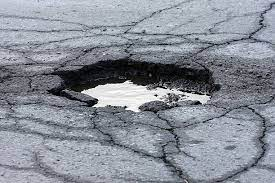

## Introduction

Perception of risk impedes people from cycling. We aim to build an AI model to estimate a score of perceived road safety based on the objects in an image. Using Google Street View, a map of safety will be affordably created for entire cities, enhancing urban planning and policies.



**Our solution**

We use a Yolov5 detection model to detect potholes. We train this model by training on custom dataset. This trained model is used then used to estimate the number of potholes in pictures provided by WDL team of Lisbon streets.

We get a number of potholes corresponding to lat and lon of particular images. We use this data to create a weighted heatmap layer to visualize the potholes across the city using two approaches. We get a beautiful heatmap indicating areas that require urgent attention and all sorts of insights just by visualizing this image.




## Development



### Dataset

- Folder images

10.000 images taken from 4 angles (0, 90, 180, 270 degrees), from 2.500 places in Lisbon, Portugal.

Name conventions: image followed just by number (e.g. image0) were taken from 0 degrees angle.

votingImage followed by number and angle - the same point as image followed by number, but different angle (e.g. image0 and votingImage0angle270 are the same place).

image followed by number and angle refers to pictures taken from a point with all 4 orientations (e.g. image3angle0 and image3angle180 are at the same point).


- Folder coordinates

2.500 text files containing the latitude and longitude coordinates of the points the images were taken (e.g. the coordinates for image816, votingImage816angle90, votingImage816angle180 and votingImage816angle270) can be obtained from the file votingImage816.txt.
                     
Coordinates for image0angle0, image0angle90, image0angle180, image270 can be obtained from the file image0.txt.

In [1]:
#! pip install -U pandas-profiling
import pandas as pd
import re
import glob2
import requests
import base64
import io
from PIL import Image
import os
import glob

import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline

In [2]:
!git clone https://github.com/ultralytics/yolov5
!pip install -U -r yolov5/requirements.txt -qq
!pip install wandb -qq
!wget https://wdl-data.fra1.digitaloceanspaces.com/cycleai/image_set.zip
!unzip -q image_set.zip

Cloning into 'yolov5'...
remote: Enumerating objects: 6294, done.
remote: Counting objects: 100% (89/89), done.
remote: Compressing objects: 100% (65/65), done.
remote: Total 6294 (delta 41), reused 57 (delta 24), pack-reused 6205
Receiving objects: 100% (6294/6294), 8.51 MiB | 25.33 MiB/s, done.
Resolving deltas: 100% (4298/4298), done.
     |████████████████████████████████| 10.3MB 5.3MB/s 
     |████████████████████████████████| 15.3MB 233kB/s 
     |████████████████████████████████| 51.0MB 77kB/s 
     |████████████████████████████████| 3.0MB 33.0MB/s 
     |████████████████████████████████| 645kB 33.5MB/s 
     |████████████████████████████████| 27.4MB 160kB/s 
     |████████████████████████████████| 81kB 8.9MB/s 
     |████████████████████████████████| 6.0MB 31.7MB/s 
     |████████████████████████████████| 9.9MB 27.5MB/s 
     |████████████████████████████████| 4.9MB 21.6MB/s 
ERROR: tensorflow 2.4.1 has requirement numpy~=1.19.2, but you'll have numpy 1.20.3 which is incompatib

In [3]:
# from google.colab import drive
# drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
print(os.listdir("/content/Competition/images"))
print("Number of images:", len(os.listdir("/content/Competition/images")))

['image862angle0.jpg', 'votingImage944angle180.jpg', 'image331.jpg', 'votingImage610angle90.jpg', 'image787angle270.jpg', 'votingImage126angle270.jpg', 'image857angle0.jpg', 'image440angle0.jpg', 'image964angle90.jpg', 'image657angle270.jpg', 'image163angle180.jpg', 'image772angle270.jpg', 'votingImage673angle180.jpg', 'votingImage377angle180.jpg', 'votingImage303angle180.jpg', 'image898angle0.jpg', 'image613angle0.jpg', 'votingImage195angle90.jpg', 'votingImage332angle180.jpg', 'image1481angle180.jpg', 'image463angle270.jpg', 'image186angle0.jpg', 'votingImage517angle270.jpg', 'image1201.jpg', 'image644angle0.jpg', 'votingImage150angle90.jpg', 'votingImage263angle180.jpg', 'image789.jpg', 'image720.jpg', 'image739angle0.jpg', 'votingImage602angle90.jpg', 'votingImage790angle180.jpg', 'image750angle180.jpg', 'image317angle0.jpg', 'image345angle180.jpg', 'votingImage646angle270.jpg', 'image1357angle0.jpg', 'image1152angle90.jpg', 'votingImage889angle270.jpg', 'votingImage665angle270.jpg

In [2]:
files = sorted(glob.glob('/content/Competition/images/image[0-9]*4.jpg'))
coordinates = glob.glob("/content/Competition/coordinates/**.txt")
print(len(files))

100


In [3]:
# Extract filenames & coordinates
# Stored to dictionary
# Key --> FileName & Val - [Lat, Lon]
coords = []
for each_coord in coordinates:
  with open(each_coord) as f:
      cds = f.read()
      cds = cds.strip("\n").strip("lat:").split(";")
      lat, lon = cds
      lat, lon = float(lat), float(lon[3:])
  
  coords.append([each_coord[33:][:-4], lat, lon])

In [ ]:
coords[:10]

[['image1215', 38.7899035, -9.1436153],
 ['votingImage593', 38.74362855624532, -9.177813009862778],
 ['votingImage83', 38.7531602, -9.1744389],
 ['votingImage525', 38.77890533976292, -9.141682086346611],
 ['votingImage731', 38.76217175987581, -9.112265086258109],
 ['image627', 38.72204892102548, -9.146683568383496],
 ['image590', 38.73395987146593, -9.181808982258163],
 ['image1224', 38.7390881, -9.1697027],
 ['votingImage867', 38.76649316415239, -9.166038149637602],
 ['votingImage14', 38.72600385186867, -9.134247895670423]]

In [4]:
coords_df = pd.DataFrame(coords, columns = ['Image', 'Latitude', "Longitude"])
coords_df.head()

,Image,Latitude,Longitude
0,image484,38.778051,-9.184334
1,image1191,38.780663,-9.179098
2,image7,38.733335,-9.183829
3,votingImage330,38.747452,-9.152617
4,image1010,38.755528,-9.149467


#### Train on Roboflow and custom annotated dataset

All images are of shape (640, 640, 3).

In [ ]:
def plot_image_grid(n:int):
    # plot the images in the batch, along with the corresponding labels
    fig = plt.figure(figsize=(25, 4))

    for i in np.arange(n):
        ax = fig.add_subplot(2, n/2, i+1, xticks=[], yticks=[])
        im = mpimg.imread(files[i+10])
        ax.imshow(im)
    plt.show()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: MatplotlibDeprecationWarning: Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.
  


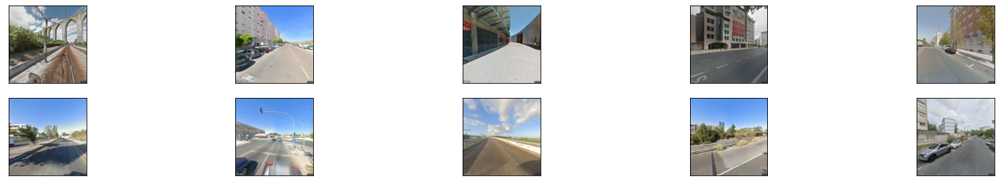

In [ ]:

plot_image_grid(10)

In [ ]:
# Original Dataset
!curl -L "https://public.roboflow.ai/ds/ArsRiBKGsO?key=FHBLrRJL2d" > potholes.zip
!unzip potholes.zip
!rm potholes.zip

## New Annotated Dataset
! curl -L "https://app.roboflow.com/ds/kWgH8oyOzl?key=BTgj6PNROt" > roboflow.zip
! unzip roboflow.zip
! rm roboflow.zip

In [ ]:
# # options for model
## 680 image size
# yolov5s.pt  
# yolov5m.pt 
# yolov5l.pt  
# yolov5x.pt

# ## 1280 image size
# yolov5s6.pt
# yolov5m6.pt
# yolov5l6.pt
# yolov5x6.pt

In [ ]:
%cd /content/yolov5/

/content/yolov5


In [ ]:
# %load_ext tensorboard
# %tensorboard --logdir runs/train

In [ ]:
!python train.py --img 680 --batch 4 --epochs 15 --data ../data.yaml --weights yolov5s.pt

remote: Enumerating objects: 4, done.
remote: Counting objects: 100% (4/4), done.
remote: Total 4 (delta 3), reused 4 (delta 3), pack-reused 0
Unpacking objects: 100% (4/4), done.
From https://github.com/ultralytics/yolov5
   d5d4cc1..9884ac9  study_activations -> origin/study_activations
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v5.0-76-g57b0d3a torch 1.8.1+cu101 CUDA:0 (Tesla K80, 11441.1875MB)

Namespace(adam=False, artifact_alias='latest', batch_size=4, bbox_interval=-1, bucket='', cache_images=False, cfg='', data='../data.yaml', device='', entity=None, epochs=15, evolve=False, exist_ok=False, global_rank=-1, hyp='data/hyp.scratch.yaml', image_weights=False, img_size=[680, 680], label_smoothing=0.0, linear_lr=False, local_rank=-1, multi_scale=False, name='exp', noautoanchor=False, nosave=False, notest=False, project='runs/train', quad=False, rect=False, resume=False, save_dir='runs/train/exp', save_period=-1, single_cls=False, sync_bn=False, total_bat

In [ ]:
! python train.py --img 680 --batch 2 --epochs 20 --data ../data.yaml --weights /content/yolov5/runs/train/exp/weights/best.pt

remote: Enumerating objects: 4, done.
remote: Counting objects: 100% (4/4), done.
remote: Compressing objects: 100% (2/2), done.
remote: Total 4 (delta 2), reused 4 (delta 2), pack-reused 0
Unpacking objects: 100% (4/4), done.
From https://github.com/ultralytics/yolov5
   9884ac9..f4fcb23  study_activations -> origin/study_activations
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v5.0-76-g57b0d3a torch 1.8.1+cu101 CUDA:0 (Tesla K80, 11441.1875MB)

Namespace(adam=False, artifact_alias='latest', batch_size=2, bbox_interval=-1, bucket='', cache_images=False, cfg='', data='../data.yaml', device='', entity=None, epochs=20, evolve=False, exist_ok=False, global_rank=-1, hyp='data/hyp.scratch.yaml', image_weights=False, img_size=[680, 680], label_smoothing=0.0, linear_lr=False, local_rank=-1, multi_scale=False, name='exp', noautoanchor=False, nosave=False, notest=False, project='runs/train', quad=False, rect=False, resume=False, save_dir='runs/train/exp2', save_perio

In [ ]:
! curl -L "https://app.roboflow.com/ds/OZvMo2Pu8B?key=i2rkXgCV5P" > roboflow.zip; 
! unzip roboflow.zip; 
! rm roboflow.zip

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   896  100   896    0     0   1397      0 --:--:-- --:--:-- --:--:--  1395
100 21.2M  100 21.2M    0     0  20.3M      0  0:00:01  0:00:01 --:--:-- 20.3M
Archive:  roboflow.zip
replace README.roboflow.txt? [y]es, [n]o, [A]ll, [N]one, [r]ename: y
 extracting: README.roboflow.txt     
replace data.yaml? [y]es, [n]o, [A]ll, [N]one, [r]ename: y
 extracting: data.yaml               
   creating: test/
   creating: test/images/
 extracting: test/images/-content-pothole600-training-rgb-0013_png_jpg.rf.9c1109f8136e1f27be7dadd6cfa0fecf.jpg  
 extracting: test/images/-content-pothole600-training-rgb-0015_png_jpg.rf.4b414f62b888ea1f5a1b6b6c8d342e02.jpg  
 extracting: test/images/-content-pothole600-training-rgb-0025_png_jpg.rf.0f2ee4b4df4343d58e9fa528c1c9b162.jpg  
 extracting: test/images/-content-pothole600-training-rgb-0038_png_jpg.rf

In [ ]:
! python train.py --img 680 --batch 2 --epochs 20 --data ../data.yaml --weights /content/drive/MyDrive/weights/exp2/best.pt

github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v5.0-81-gabfcf9e torch 1.8.1+cu101 CUDA:0 (Tesla K80, 11441.1875MB)

Namespace(adam=False, artifact_alias='latest', batch_size=2, bbox_interval=-1, bucket='', cache_images=False, cfg='', data='../data.yaml', device='', entity=None, epochs=20, evolve=False, exist_ok=False, global_rank=-1, hyp='data/hyp.scratch.yaml', image_weights=False, img_size=[680, 680], label_smoothing=0.0, linear_lr=False, local_rank=-1, multi_scale=False, name='exp', noautoanchor=False, nosave=False, notest=False, project='runs/train', quad=False, rect=False, resume=False, save_dir='runs/train/exp2', save_period=-1, single_cls=False, sync_bn=False, total_batch_size=2, upload_dataset=False, weights='/content/drive/MyDrive/weights/exp2/best.pt', workers=8, world_size=1)
tensorboard: Start with 'tensorboard --logdir runs/train', view at http://localhost:6006/
2021-05-12 11:23:48.171736: I tensorflow/stream_executor/platform/default/dso_loader.c

In [ ]:
# Run inference on competition Images and store to results.txt
! python detect.py --source /content/Competition/images --weights /content/drive/MyDrive/weights/exp2/best.pt --conf 0.25 >> /content/results.txt

YOLOv5 🚀 v5.0-81-gabfcf9e torch 1.8.1+cu101 CUDA:0 (Tesla K80, 11441.1875MB)

Fusing layers... 
Model Summary: 224 layers, 7053910 parameters, 0 gradients, 16.3 GFLOPS


In [ ]:
pred_files = sorted(glob.glob('/content/yolov5/runs/detect/exp/**.jpg'))
pred_files = [x for x in pred_files if "angle0" in x]
#print(len(pred_files))

#### Visualize predictions

In [ ]:
def plot_image_grid(n:int):
    # plot the images in the batch, along with the corresponding labels
    fig = plt.figure(figsize=(25, 4))

    for i in np.arange(n):
        ax = fig.add_subplot(2, n/2, i+1, xticks=[], yticks=[])
        im = mpimg.imread(pred_files[i+10])
        ax.imshow(im)
    plt.show()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: MatplotlibDeprecationWarning: Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.
  


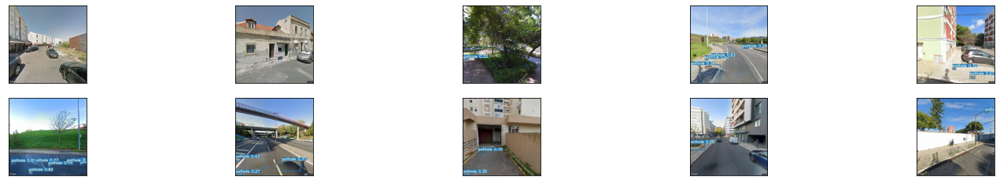

In [ ]:
# predictions
plot_image_grid(10)

In [9]:
# Store File names and Potholes
image_potholes = []

## Read results text file
#with open('/content/results.txt') as f:
with open('/content/drive/MyDrive/weights/results.txt') as f:
    line = f.readline()

    # Loop through each line
    while line:
      line = f.readline()
      if line[:5] == "image":
        line_split = line.split(" ")

        # Get file name
        image_name = re.search('images/(.*):', line_split[2]).group(1)
        
        # Collect only angle0 images
        if "angle0" in image_name:

          # if file contains potholes
          if len(line_split) == 8:
            image_potholes.append([image_name[:-10], int(line_split[4])])


          # If it doesn't
          if len(line_split) == 6:
            image_potholes.append([image_name[:-10], 0])

#### Additional dataset

Reference dataset: 
- https://sites.google.com/view/pothole-600/dataset?authuser=0
- https://www.kaggle.com/atulyakumar98/pothole-detection-dataset

In [6]:
# Download images from google drive
! gdown --id 1erdM6nnTtwYF9tArjTPO0RPHOxK68-3d
! unzip /content/pothole600.zip

all_files = glob2.glob("/content/pothole600/training/rgb/**.png")
all_files = glob2.glob("/content/pothole600/testing/rgb/**.png")

Downloading...
From: https://drive.google.com/uc?id=1erdM6nnTtwYF9tArjTPO0RPHOxK68-3d
To: /content/pothole600.zip
223MB [00:02, 98.5MB/s]
Archive:  /content/pothole600.zip
   creating: pothole600/
   creating: pothole600/testing/
   creating: pothole600/testing/label/
  inflating: pothole600/testing/label/0000.png  
  inflating: pothole600/testing/label/0001.png  
  inflating: pothole600/testing/label/0002.png  
  inflating: pothole600/testing/label/0003.png  
  inflating: pothole600/testing/label/0004.png  
  inflating: pothole600/testing/label/0005.png  
  inflating: pothole600/testing/label/0006.png  
  inflating: pothole600/testing/label/0007.png  
  inflating: pothole600/testing/label/0008.png  
  inflating: pothole600/testing/label/0009.png  
  inflating: pothole600/testing/label/0010.png  
  inflating: pothole600/testing/label/0011.png  
  inflating: pothole600/testing/label/0012.png  
  inflating: pothole600/testing/label/0013.png  
  inflating: pothole600/testing/label/0014.pn

In [7]:
# Upload images to Roboflow for annotation
for f in all_files:

  # Load Image with PIL
  image = Image.open(f).convert("RGB")

  # Convert to JPEG Buffer
  buffered = io.BytesIO()
  image.save(buffered, quality=90, format="JPEG")

  # Base 64 Encode
  img_str = base64.b64encode(buffered.getvalue())
  img_str = img_str.decode("ascii")

  # Construct the URL
  upload_url = "".join([
      "https://api.roboflow.com/dataset/streetview_potholes/upload",
      "?api_key={api_key}",
      "&name={0}.jpg".format(f),
      "&split=train"
  ])

  # POST to the API
  r = requests.post(upload_url, data=img_str, headers={
      "Content-Type": "application/x-www-form-urlencoded"
  })

  # Output result
  print(r.json())

In [10]:
image_potholes_df = pd.DataFrame(image_potholes, columns=["image_name", "num_potholes"])
image_potholes_df.head()

,image_name,num_potholes
0,image0,1
1,image1000,0
2,image1001,2
3,image1002,1
4,image1003,0


In [11]:
merged_df = image_potholes_df.merge(coords_df, how="inner", left_on="image_name", right_on="Image")
merged_df = merged_df[[x for x in merged_df.columns.values if x != "image_name"]]
merged_df.head()

,num_potholes,Image,Latitude,Longitude
0,1,image0,38.732772,-9.172049
1,0,image1000,38.775419,-9.170859
2,2,image1001,38.734225,-9.120122
3,1,image1002,38.763418,-9.151232
4,0,image1003,38.742027,-9.164232


In [ ]:
merged_df.to_csv("Lisbon_potholes.csv", index=None)

#### Heatmap Layers


We visualize the heatmaps using two approaches
- Heatmap layer by Google Maps
- Heatmap using Folium

In [ ]:
#@title HTML
%%writefile map_render.html

<!DOCTYPE html>
<html>
  <head>
    <title>Heatmaps</title>
    <script src="https://polyfill.io/v3/polyfill.min.js?features=default"></script>
    <link rel="stylesheet" type="text/css" href="./render_map.css" />
    <script src="./render_map.js"></script>
    <!-- jsFiddle will insert css and js -->
  </head>
  <body>
    <div id="floating-panel">
      <button onclick="toggleHeatmap()">Toggle Heatmap</button>
      <button onclick="changeGradient()">Change gradient</button>
      <button onclick="changeRadius()">Change radius</button>
      <button onclick="changeOpacity()">Change opacity</button>
    </div>
    <div id="map"></div>

    <!-- Async script executes immediately and must be after any DOM elements used in callback. -->
    <script
      src="https://maps.googleapis.com/maps/api/js?key=APIKEY&callback=initMap&libraries=visualization&v=weekly"
      async
    ></script>
  </body>
</html>

Writing map_render.html


In [ ]:
#@title CSS
%%writefile render_map.css

/* Always set the map height explicitly to define the size of the div
       * element that contains the map. */
#map {
  height: 100%;
}

/* Optional: Makes the sample page fill the window. */
html,
body {
  height: 100%;
  margin: 0;
  padding: 0;
}

#floating-panel {
  position: absolute;
  top: 10px;
  left: 25%;
  z-index: 5;
  background-color: #fff;
  padding: 5px;
  border: 1px solid #999;
  text-align: center;
  font-family: "Roboto", "sans-serif";
  line-height: 30px;
  padding-left: 10px;
}

#floating-panel {
  background-color: #fff;
  border: 1px solid #999;
  left: 25%;
  padding: 5px;
  position: absolute;
  top: 10px;
  z-index: 5;
}

Writing render_map.css


In [ ]:
#@title JS
%%writefile render_map.js

// This example requires the Visualization library. Include the libraries=visualization
// parameter when you first load the API. For example:
// <script src="https://maps.googleapis.com/maps/api/js?key=APIKEY&libraries=visualization">
let map, heatmap;

function initMap() {
  map = new google.maps.Map(document.getElementById("map"), {
    zoom: 13,
    center: { lat: 38.736946, lng: -9.142685 },
    mapTypeId: "satellite",
  });
  heatmap = new google.maps.visualization.HeatmapLayer({
    data: getPoints(),
    map: map,
  });
}

function toggleHeatmap() {
  heatmap.setMap(heatmap.getMap() ? null : map);
}

function changeGradient() {
  const gradient = [
    "rgba(0, 255, 255, 0)",
    "rgba(0, 255, 255, 1)",
    "rgba(0, 191, 255, 1)",
    "rgba(0, 127, 255, 1)",
    "rgba(0, 63, 255, 1)",
    "rgba(0, 0, 255, 1)",
    "rgba(0, 0, 223, 1)",
    "rgba(0, 0, 191, 1)",
    "rgba(0, 0, 159, 1)",
    "rgba(0, 0, 127, 1)",
    "rgba(63, 0, 91, 1)",
    "rgba(127, 0, 63, 1)",
    "rgba(191, 0, 31, 1)",
    "rgba(255, 0, 0, 1)",
  ];
  heatmap.set("gradient", heatmap.get("gradient") ? null : gradient);
}

function changeRadius() {
  heatmap.set("radius", heatmap.get("radius") ? null : 20);
}

function changeOpacity() {
  heatmap.set("opacity", heatmap.get("opacity") ? null : 0.2);
}

// Heatmap data: 500 Points
function getPoints() {
  return [
{location: new google.maps.LatLng(38.73277225961562, -9.172048739336), weight: 1},
{location: new google.maps.LatLng(38.7754189, -9.1708593), weight: 0},
{location: new google.maps.LatLng(38.7342251, -9.120122), weight: 2},
{location: new google.maps.LatLng(38.7634181, -9.1512324), weight: 1},
{location: new google.maps.LatLng(38.74202677828567, -9.164232173452977), weight: 0},
{location: new google.maps.LatLng(38.74438405691944, -9.173980870657665), weight: 2},
{location: new google.maps.LatLng(38.7665441, -9.177003), weight: 0},
{location: new google.maps.LatLng(38.73234305868907, -9.179882052284183), weight: 3},
{location: new google.maps.LatLng(38.78638497055522, -9.130889335505106), weight: 1},
{location: new google.maps.LatLng(38.7452703, -9.1949057), weight: 3},
{location: new google.maps.LatLng(38.76600867122635, -9.19227103487446), weight: 1},
{location: new google.maps.LatLng(38.77974496618023, -9.124785817496566), weight: 2},
{location: new google.maps.LatLng(38.75552804385156, -9.149467158912639), weight: 2},
{location: new google.maps.LatLng(38.7337782, -9.1658066), weight: 5},
{location: new google.maps.LatLng(38.73186759001884, -9.159063310803841), weight: 1},
{location: new google.maps.LatLng(38.74771236172261, -9.15019991354848), weight: 1},
{location: new google.maps.LatLng(38.76120366859239, -9.135915489428452), weight: 0},
{location: new google.maps.LatLng(38.72496306807523, -9.154511544692426), weight: 1},
{location: new google.maps.LatLng(38.75296407024631, -9.188250732894584), weight: 1},
{location: new google.maps.LatLng(38.77723553619839, -9.188814652752779), weight: 3},
{location: new google.maps.LatLng(38.78237653444336, -9.140654798401016), weight: 0},
{location: new google.maps.LatLng(38.776371, -9.184495), weight: 1},
{location: new google.maps.LatLng(38.7768958, -9.1763434), weight: 1},
{location: new google.maps.LatLng(38.78607271176424, -9.139599250566127), weight: 3},
{location: new google.maps.LatLng(38.78541415761194, -9.153973904289991), weight: 1},
{location: new google.maps.LatLng(38.77671903151385, -9.188988087290326), weight: 0},
{location: new google.maps.LatLng(38.78909873543503, -9.160624687373321), weight: 0},
{location: new google.maps.LatLng(38.75284909956427, -9.118823160400813), weight: 1},
{location: new google.maps.LatLng(38.76812558206773, -9.182088831007153), weight: 0},
{location: new google.maps.LatLng(38.77541296135019, -9.145769235571057), weight: 2},
{location: new google.maps.LatLng(38.77195518646273, -9.185143955480093), weight: 3},
{location: new google.maps.LatLng(38.7705409, -9.16028), weight: 4},
{location: new google.maps.LatLng(38.73218926053116, -9.139441398546559), weight: 1},
{location: new google.maps.LatLng(38.76602819043656, -9.148237415659384), weight: 2},
{location: new google.maps.LatLng(38.74561393210584, -9.150754032906509), weight: 3},
{location: new google.maps.LatLng(38.7509717, -9.1693483), weight: 1},
{location: new google.maps.LatLng(38.75403157751765, -9.135802398257361), weight: 2},
{location: new google.maps.LatLng(38.7379269, -9.1750476), weight: 2},
{location: new google.maps.LatLng(38.7814637982319, -9.138881055764298), weight: 0},
{location: new google.maps.LatLng(38.72860261799421, -9.14832133569313), weight: 0},
{location: new google.maps.LatLng(38.77870052460058, -9.148936175334127), weight: 0},
{location: new google.maps.LatLng(38.74290444340002, -9.182732763225438), weight: 1},
{location: new google.maps.LatLng(38.75325433852088, -9.197094866791316), weight: 1},
{location: new google.maps.LatLng(38.75540086847984, -9.140853459369755), weight: 1},
{location: new google.maps.LatLng(38.77418449278711, -9.188255460165767), weight: 0},
{location: new google.maps.LatLng(38.7540928, -9.1161916), weight: 0},
{location: new google.maps.LatLng(38.74139539942811, -9.18862786103666), weight: 3},
{location: new google.maps.LatLng(38.75288103093335, -9.166677928642425), weight: 7},
{location: new google.maps.LatLng(38.74946607843022, -9.191248086713763), weight: 1},
{location: new google.maps.LatLng(38.72970336377168, -9.176186060817649), weight: 2},
{location: new google.maps.LatLng(38.7264885846175, -9.137979144102175), weight: 0},
{location: new google.maps.LatLng(38.73982135572268, -9.149926662133925), weight: 2},
{location: new google.maps.LatLng(38.7597344, -9.1622866), weight: 1},
{location: new google.maps.LatLng(38.76079907759387, -9.173795705391838), weight: 2},
{location: new google.maps.LatLng(38.74300545980019, -9.133609153896916), weight: 1},
{location: new google.maps.LatLng(38.7364778824752, -9.115483155940103), weight: 3},
{location: new google.maps.LatLng(38.7588492, -9.1570396), weight: 0},
{location: new google.maps.LatLng(38.75193465850663, -9.123366453697422), weight: 2},
{location: new google.maps.LatLng(38.7854085, -9.1432671), weight: 0},
{location: new google.maps.LatLng(38.73585713439314, -9.15801621846513), weight: 1},
{location: new google.maps.LatLng(38.77251671956653, -9.150018440424633), weight: 2},
{location: new google.maps.LatLng(38.75695036603771, -9.149338573854397), weight: 2},
{location: new google.maps.LatLng(38.77153171704628, -9.12674852534361), weight: 0},
{location: new google.maps.LatLng(38.74585877174288, -9.178898375072357), weight: 0},
{location: new google.maps.LatLng(38.74476818599045, -9.140235048754349), weight: 2},
{location: new google.maps.LatLng(38.7762801, -9.1866113), weight: 2},
{location: new google.maps.LatLng(38.7545426, -9.196017), weight: 2},
{location: new google.maps.LatLng(38.75858757868908, -9.151174113045403), weight: 0},
{location: new google.maps.LatLng(38.77602024490434, -9.119923735533929), weight: 0},
{location: new google.maps.LatLng(38.7274306878564, -9.181110737633276), weight: 2},
{location: new google.maps.LatLng(38.77284910807356, -9.128451286624411), weight: 1},
{location: new google.maps.LatLng(38.7886814644822, -9.166226926854149), weight: 1},
{location: new google.maps.LatLng(38.73895023539918, -9.12055098373731), weight: 2},
{location: new google.maps.LatLng(38.7413778, -9.1880372), weight: 1},
{location: new google.maps.LatLng(38.75093, -9.1652969), weight: 5},
{location: new google.maps.LatLng(38.75854614258833, -9.108811506729047), weight: 0},
{location: new google.maps.LatLng(38.74420180711184, -9.166682422177955), weight: 5},
{location: new google.maps.LatLng(38.77604811078321, -9.117926379470937), weight: 0},
{location: new google.maps.LatLng(38.73584430384728, -9.1330695403515), weight: 1},
{location: new google.maps.LatLng(38.7406929, -9.1119827), weight: 1},
{location: new google.maps.LatLng(38.73951710276194, -9.114724898868946), weight: 2},
{location: new google.maps.LatLng(38.7317312, -9.1308688), weight: 0},
{location: new google.maps.LatLng(38.7743764, -9.1776198), weight: 0},
{location: new google.maps.LatLng(38.7315316672268, -9.151654468555941), weight: 0},
{location: new google.maps.LatLng(38.75111095891355, -9.130652522938565), weight: 2},
{location: new google.maps.LatLng(38.74302416706631, -9.183677533550828), weight: 1},
{location: new google.maps.LatLng(38.73550050529406, -9.119118348360466), weight: 1},
{location: new google.maps.LatLng(38.7722467, -9.1937945), weight: 1},
{location: new google.maps.LatLng(38.7688153, -9.1296775), weight: 1},
{location: new google.maps.LatLng(38.72859300211388, -9.127028101405378), weight: 0},
{location: new google.maps.LatLng(38.7251967180037, -9.140462779929534), weight: 0},
{location: new google.maps.LatLng(38.72641168514281, -9.15526570890215), weight: 1},
{location: new google.maps.LatLng(38.78976347532806, -9.139012787480969), weight: 2},
{location: new google.maps.LatLng(38.77730488312402, -9.146563282348556), weight: 1},
{location: new google.maps.LatLng(38.73702759641609, -9.17676265862575), weight: 2},
{location: new google.maps.LatLng(38.74805957047833, -9.114175921659879), weight: 0},
{location: new google.maps.LatLng(38.72458505824092, -9.176997486664707), weight: 1},
{location: new google.maps.LatLng(38.77284910807356, -9.128451286624411), weight: 1},
{location: new google.maps.LatLng(38.75681576397515, -9.15222517302002), weight: 1},
{location: new google.maps.LatLng(38.7676608, -9.1151935), weight: 1},
{location: new google.maps.LatLng(38.7688153, -9.1296775), weight: 1},
{location: new google.maps.LatLng(38.7762174, -9.1773291), weight: 1},
{location: new google.maps.LatLng(38.7267671, -9.170995), weight: 3},
{location: new google.maps.LatLng(38.76649694113863, -9.154176004989035), weight: 0},
{location: new google.maps.LatLng(38.7446259, -9.1394798), weight: 0},
{location: new google.maps.LatLng(38.74258781834963, -9.16705316937205), weight: 0},
{location: new google.maps.LatLng(38.75291404523033, -9.130628472726567), weight: 4},
{location: new google.maps.LatLng(38.75339242341977, -9.199487076219762), weight: 1},
{location: new google.maps.LatLng(38.77629085750475, -9.142960761581248), weight: 1},
{location: new google.maps.LatLng(38.72803479277921, -9.162383534561862), weight: 1},
{location: new google.maps.LatLng(38.73675793929062, -9.18268845359514), weight: 2},
{location: new google.maps.LatLng(38.7439627, -9.1136023), weight: 0},
{location: new google.maps.LatLng(38.73247009838578, -9.122494368143961), weight: 3},
{location: new google.maps.LatLng(38.74085743159293, -9.12115372369513), weight: 1},
{location: new google.maps.LatLng(38.77492739992314, -9.123238847244677), weight: 1},
{location: new google.maps.LatLng(38.72972394434026, -9.17434841125481), weight: 1},
{location: new google.maps.LatLng(38.75545054031089, -9.121437977821458), weight: 0},
{location: new google.maps.LatLng(38.77314033733244, -9.173097236771664), weight: 0},
{location: new google.maps.LatLng(38.75108328505486, -9.158369618154447), weight: 1},
{location: new google.maps.LatLng(38.7717948, -9.165094), weight: 1},
{location: new google.maps.LatLng(38.7617939, -9.1892999), weight: 0},
{location: new google.maps.LatLng(38.74269497370226, -9.160620838096907), weight: 1},
{location: new google.maps.LatLng(38.7795241, -9.1247319), weight: 1},
{location: new google.maps.LatLng(38.74594206152438, -9.122247905464494), weight: 1},
{location: new google.maps.LatLng(38.75472049936411, -9.151259309502349), weight: 1},
{location: new google.maps.LatLng(38.77262601842531, -9.169952747929333), weight: 1},
{location: new google.maps.LatLng(38.7400515, -9.1918564), weight: 5},
{location: new google.maps.LatLng(38.74809591440464, -9.172402347683809), weight: 1},
{location: new google.maps.LatLng(38.76491096267582, -9.148457630704112), weight: 0},
{location: new google.maps.LatLng(38.76271253569351, -9.18560015124516), weight: 1},
{location: new google.maps.LatLng(38.72158291648358, -9.144940105440226), weight: 0},
{location: new google.maps.LatLng(38.77956297152538, -9.151413901533312), weight: 0},
{location: new google.maps.LatLng(38.78084562505923, -9.150092246047144), weight: 3},
{location: new google.maps.LatLng(38.73220648124784, -9.122762116054318), weight: 3},
{location: new google.maps.LatLng(38.73023866073905, -9.148335967830882), weight: 1},
{location: new google.maps.LatLng(38.7408447, -9.1165135), weight: 2},
{location: new google.maps.LatLng(38.73781345140068, -9.1320811456234), weight: 0},
{location: new google.maps.LatLng(38.7761298, -9.1264841), weight: 0},
{location: new google.maps.LatLng(38.7685651843636, -9.146763618275223), weight: 3},
{location: new google.maps.LatLng(38.7381102878995, -9.185595221446244), weight: 0},
{location: new google.maps.LatLng(38.77525382790696, -9.14384376635567), weight: 2},
{location: new google.maps.LatLng(38.73261680799414, -9.175892137501233), weight: 2},
{location: new google.maps.LatLng(38.77687807019053, -9.176267491400214), weight: 0},
{location: new google.maps.LatLng(38.77859084354291, -9.17185669558782), weight: 2},
{location: new google.maps.LatLng(38.73301760902629, -9.122834679995583), weight: 0},
{location: new google.maps.LatLng(38.73017799443758, -9.146909553443408), weight: 0},
{location: new google.maps.LatLng(38.74622489626164, -9.142891445686113), weight: 2},
{location: new google.maps.LatLng(38.72016387545393, -9.150578318562065), weight: 2},
{location: new google.maps.LatLng(38.7333357, -9.1846659), weight: 3},
{location: new google.maps.LatLng(38.76491096267582, -9.148457630704112), weight: 0},
{location: new google.maps.LatLng(38.76935188201374, -9.146418188004526), weight: 2},
{location: new google.maps.LatLng(38.7745589, -9.1188067), weight: 0},
{location: new google.maps.LatLng(38.76172900000916, -9.188160408194298), weight: 1},
{location: new google.maps.LatLng(38.78727366861592, -9.15768725977931), weight: 0},
{location: new google.maps.LatLng(38.7387425, -9.1787574), weight: 1},
{location: new google.maps.LatLng(38.73136441154126, -9.155874981630937), weight: 0},
{location: new google.maps.LatLng(38.73538597042052, -9.13814545730108), weight: 0},
{location: new google.maps.LatLng(38.78804147948627, -9.14563942275135), weight: 1},
{location: new google.maps.LatLng(38.76391122328751, -9.112247772478653), weight: 1},
{location: new google.maps.LatLng(38.76688258412155, -9.164917237067998), weight: 2},
{location: new google.maps.LatLng(38.78969609298746, -9.144560374500934), weight: 0},
{location: new google.maps.LatLng(38.72194916063758, -9.16958578804681), weight: 0},
{location: new google.maps.LatLng(38.73958513904704, -9.180099605028659), weight: 1},
{location: new google.maps.LatLng(38.73370894494764, -9.124965175244323), weight: 4},
{location: new google.maps.LatLng(38.75574383274073, -9.13381238821078), weight: 2},
{location: new google.maps.LatLng(38.75082264465077, -9.187171328807807), weight: 8},
{location: new google.maps.LatLng(38.74828405336269, -9.117265859803277), weight: 3},
{location: new google.maps.LatLng(38.76354612656827, -9.152053327778837), weight: 2},
{location: new google.maps.LatLng(38.73633101394982, -9.149296450291125), weight: 1},
{location: new google.maps.LatLng(38.72844237147298, -9.160070615499396), weight: 1},
{location: new google.maps.LatLng(38.76154164592642, -9.180188945060646), weight: 0},
{location: new google.maps.LatLng(38.75874240725041, -9.167410051206302), weight: 0},
{location: new google.maps.LatLng(38.7672993, -9.1465159), weight: 1},
{location: new google.maps.LatLng(38.76892872374346, -9.158975231785591), weight: 2},
{location: new google.maps.LatLng(38.7284131, -9.1645318), weight: 3},
{location: new google.maps.LatLng(38.7589395, -9.1513192), weight: 1},
{location: new google.maps.LatLng(38.72564784110565, -9.172034957510988), weight: 0},
{location: new google.maps.LatLng(38.7307940885627, -9.127819740105103), weight: 0},
{location: new google.maps.LatLng(38.75805445538956, -9.125927981402349), weight: 0},
{location: new google.maps.LatLng(38.72603824429564, -9.16910835540803), weight: 0},
{location: new google.maps.LatLng(38.78472502860707, -9.160740045618214), weight: 1},
{location: new google.maps.LatLng(38.74163762967407, -9.156217189930304), weight: 2},
{location: new google.maps.LatLng(38.78165312405063, -9.144180325849097), weight: 1},
{location: new google.maps.LatLng(38.7412061, -9.1537538), weight: 2},
{location: new google.maps.LatLng(38.78499704935455, -9.15406770604284), weight: 1},
{location: new google.maps.LatLng(38.71986158159915, -9.148125162059882), weight: 0},
{location: new google.maps.LatLng(38.73909268407554, -9.14442046444665), weight: 0},
{location: new google.maps.LatLng(38.77698125147403, -9.156564672578943), weight: 0},
{location: new google.maps.LatLng(38.73041891699707, -9.135405678857241), weight: 1},
{location: new google.maps.LatLng(38.78132606958112, -9.182002667236635), weight: 0},
{location: new google.maps.LatLng(38.75910517890449, -9.17590228986614), weight: 1},
{location: new google.maps.LatLng(38.74399846340144, -9.191053647128683), weight: 2},
{location: new google.maps.LatLng(38.734592, -9.1792791), weight: 1},
{location: new google.maps.LatLng(38.741678, -9.1763029), weight: 1},
{location: new google.maps.LatLng(38.735335, -9.1718899), weight: 1},
{location: new google.maps.LatLng(38.74419206557703, -9.146005103039782), weight: 0},
{location: new google.maps.LatLng(38.75084420360896, -9.171941155444404), weight: 3},
{location: new google.maps.LatLng(38.72891158811824, -9.147088762184804), weight: 1},
{location: new google.maps.LatLng(38.73943139683125, -9.145055727994013), weight: 0},
{location: new google.maps.LatLng(38.74225106625399, -9.145915399487677), weight: 2},
{location: new google.maps.LatLng(38.73582981208882, -9.17134308470387), weight: 0},
{location: new google.maps.LatLng(38.74328166890123, -9.118828672167627), weight: 1},
{location: new google.maps.LatLng(38.7625467380497, -9.151788109322398), weight: 1},
{location: new google.maps.LatLng(38.7590983, -9.1638164), weight: 1},
{location: new google.maps.LatLng(38.76798921054552, -9.167718760441213), weight: 6},
{location: new google.maps.LatLng(38.77395736227082, -9.179236916323678), weight: 0},
{location: new google.maps.LatLng(38.73283839564525, -9.150495584951681), weight: 0},
{location: new google.maps.LatLng(38.7554521, -9.1559472), weight: 0},
{location: new google.maps.LatLng(38.73849089105793, -9.129824659868149), weight: 1},
{location: new google.maps.LatLng(38.77848515906875, -9.127124452392136), weight: 1},
{location: new google.maps.LatLng(38.74480269887032, -9.148533743644464), weight: 0},
{location: new google.maps.LatLng(38.75077767562139, -9.125424597494941), weight: 2},
{location: new google.maps.LatLng(38.78066284106158, -9.179098362219708), weight: 3},
{location: new google.maps.LatLng(38.7693012745572, -9.120743916064916), weight: 1},
{location: new google.maps.LatLng(38.78629060284419, -9.171631054397304), weight: 1},
{location: new google.maps.LatLng(38.786088, -9.1739015), weight: 0},
{location: new google.maps.LatLng(38.7720901, -9.1589499), weight: 0},
{location: new google.maps.LatLng(38.72450274037342, -9.16492583109011), weight: 0},
{location: new google.maps.LatLng(38.76935188201374, -9.146418188004526), weight: 2},
{location: new google.maps.LatLng(38.78851780295158, -9.168242954814902), weight: 0},
{location: new google.maps.LatLng(38.7236758, -9.165507), weight: 0},
{location: new google.maps.LatLng(38.77085538721728, -9.170734243124652), weight: 1},
{location: new google.maps.LatLng(38.77377259732794, -9.164865924840777), weight: 3},
{location: new google.maps.LatLng(38.77347507679578, -9.159506096036226), weight: 0},
{location: new google.maps.LatLng(38.7853301, -9.1577704), weight: 3},
{location: new google.maps.LatLng(38.7335131, -9.1588884), weight: 0},
{location: new google.maps.LatLng(38.78215675901129, -9.156386040346593), weight: 0},
{location: new google.maps.LatLng(38.77220808812601, -9.116980422134842), weight: 0},
{location: new google.maps.LatLng(38.74992295684831, -9.191238879068173), weight: 0},
{location: new google.maps.LatLng(38.74416544043238, -9.159484616895801), weight: 0},
{location: new google.maps.LatLng(38.74749010317975, -9.175948926319007), weight: 1},
{location: new google.maps.LatLng(38.75016797396928, -9.132049088277276), weight: 0},
{location: new google.maps.LatLng(38.75164429663513, -9.149283184096456), weight: 1},
{location: new google.maps.LatLng(38.7612559, -9.1693564), weight: 1},
{location: new google.maps.LatLng(38.73496985443623, -9.150735855394137), weight: 1},
{location: new google.maps.LatLng(38.76704448138013, -9.12102225942038), weight: 2},
{location: new google.maps.LatLng(38.7233434375005, -9.15927475970865), weight: 1},
{location: new google.maps.LatLng(38.7602198, -9.116489), weight: 0},
{location: new google.maps.LatLng(38.76382924499053, -9.168412097149684), weight: 2},
{location: new google.maps.LatLng(38.7899035, -9.1436153), weight: 1},
{location: new google.maps.LatLng(38.732104, -9.124168), weight: 3},
{location: new google.maps.LatLng(38.76409427399484, -9.131955822937142), weight: 1},
{location: new google.maps.LatLng(38.74320879695203, -9.156691576076462), weight: 0},
{location: new google.maps.LatLng(38.7462895, -9.1667628), weight: 1},
{location: new google.maps.LatLng(38.7366765, -9.188399), weight: 0},
{location: new google.maps.LatLng(38.7710801831873, -9.148876254552132), weight: 0},
{location: new google.maps.LatLng(38.7365604, -9.163697), weight: 3},
{location: new google.maps.LatLng(38.7285208, -9.1700564), weight: 2},
{location: new google.maps.LatLng(38.74337159420644, -9.118827263232175), weight: 1},
{location: new google.maps.LatLng(38.7390881, -9.1697027), weight: 3},
{location: new google.maps.LatLng(38.76465550633181, -9.128295644267954), weight: 0},
{location: new google.maps.LatLng(38.739753610237, -9.181632408441214), weight: 2},
{location: new google.maps.LatLng(38.77987895700775, -9.125884103779528), weight: 0},
{location: new google.maps.LatLng(38.73947817681395, -9.11774397844877), weight: 3},
{location: new google.maps.LatLng(38.75290727754302, -9.186008190977816), weight: 0},
{location: new google.maps.LatLng(38.74042031088443, -9.112563763738383), weight: 1},
{location: new google.maps.LatLng(38.73629736195852, -9.158798097538972), weight: 1},
{location: new google.maps.LatLng(38.75835268289996, -9.168862645591487), weight: 1},
{location: new google.maps.LatLng(38.76277743420366, -9.138321675013408), weight: 0},
{location: new google.maps.LatLng(38.77144205577792, -9.145565295847195), weight: 2},
{location: new google.maps.LatLng(38.7489887087497, -9.119390952720781), weight: 0},
{location: new google.maps.LatLng(38.76122828750045, -9.136179749995609), weight: 1},
{location: new google.maps.LatLng(38.78686230406398, -9.155020197775203), weight: 1},
{location: new google.maps.LatLng(38.76793567754715, -9.183974238726904), weight: 1},
{location: new google.maps.LatLng(38.76555753604546, -9.129185374994082), weight: 1},
{location: new google.maps.LatLng(38.74412360000001, -9.152588200000002), weight: 1},
{location: new google.maps.LatLng(38.7438437005666, -9.161103013260888), weight: 1},
{location: new google.maps.LatLng(38.78043852337565, -9.172709406658285), weight: 0},
{location: new google.maps.LatLng(38.75001984695354, -9.178648071597044), weight: 1},
{location: new google.maps.LatLng(38.7623098, -9.1303977), weight: 3},
{location: new google.maps.LatLng(38.7459569680566, -9.159318551783178), weight: 1},
{location: new google.maps.LatLng(38.7618995, -9.1801877), weight: 2},
{location: new google.maps.LatLng(38.75206697932011, -9.147137633138854), weight: 1},
{location: new google.maps.LatLng(38.73806236220315, -9.185495238358788), weight: 1},
{location: new google.maps.LatLng(38.73511288870134, -9.125108999235001), weight: 0},
{location: new google.maps.LatLng(38.77185887558028, -9.122204037029386), weight: 3},
{location: new google.maps.LatLng(38.72557027406205, -9.139860853515703), weight: 0},
{location: new google.maps.LatLng(38.75065408853328, -9.158706329250725), weight: 4},
{location: new google.maps.LatLng(38.74458312930876, -9.17489194951628), weight: 1},
{location: new google.maps.LatLng(38.76821337785115, -9.185777967834534), weight: 0},
{location: new google.maps.LatLng(38.767314307807, -9.121026246671743), weight: 0},
{location: new google.maps.LatLng(38.73406934351313, -9.155649115976843), weight: 1},
{location: new google.maps.LatLng(38.77224910273294, -9.187298513359277), weight: 0},
{location: new google.maps.LatLng(38.7629154, -9.1952856), weight: 0},
{location: new google.maps.LatLng(38.78334602286719, -9.156752128015306), weight: 0},
{location: new google.maps.LatLng(38.77978432328717, -9.139993918301746), weight: 2},
{location: new google.maps.LatLng(38.7461205, -9.1813701), weight: 0},
{location: new google.maps.LatLng(38.75767844930095, -9.140597070421965), weight: 1},
{location: new google.maps.LatLng(38.7608115, -9.1799816), weight: 0},
{location: new google.maps.LatLng(38.7556248, -9.1786468), weight: 1},
{location: new google.maps.LatLng(38.7255934, -9.1400462), weight: 2},
{location: new google.maps.LatLng(38.76568677611505, -9.161274938232685), weight: 4},
{location: new google.maps.LatLng(38.76151762924213, -9.168253032397192), weight: 0},
{location: new google.maps.LatLng(38.75134297419802, -9.147190569529052), weight: 0},
{location: new google.maps.LatLng(38.74217040986372, -9.15973635864102), weight: 1},
{location: new google.maps.LatLng(38.73766637702159, -9.142818096114521), weight: 0},
{location: new google.maps.LatLng(38.7781064513911, -9.144718437688097), weight: 2},
{location: new google.maps.LatLng(38.74462996375934, -9.168616976227549), weight: 0},
{location: new google.maps.LatLng(38.7673547, -9.1699809), weight: 0},
{location: new google.maps.LatLng(38.7320434, -9.1695497), weight: 0},
{location: new google.maps.LatLng(38.75387187041012, -9.184774554779409), weight: 0},
{location: new google.maps.LatLng(38.74083329441888, -9.16204638021483), weight: 0},
{location: new google.maps.LatLng(38.7714726, -9.1255011), weight: 4},
{location: new google.maps.LatLng(38.7364651, -9.1170534), weight: 0},
{location: new google.maps.LatLng(38.72375361723261, -9.162799795488189), weight: 1},
{location: new google.maps.LatLng(38.7479391, -9.1583903), weight: 1},
{location: new google.maps.LatLng(38.7477442, -9.1797611), weight: 1},
{location: new google.maps.LatLng(38.7720303, -9.1590752), weight: 0},
{location: new google.maps.LatLng(38.74805986187819, -9.192037669109485), weight: 0},
{location: new google.maps.LatLng(38.7551927095308, -9.117019670145378), weight: 1},
{location: new google.maps.LatLng(38.73584430384728, -9.1330695403515), weight: 1},
{location: new google.maps.LatLng(38.74823625775242, -9.134741148634136), weight: 3},
{location: new google.maps.LatLng(38.73567310060116, -9.134791696062953), weight: 1},
{location: new google.maps.LatLng(38.7844088, -9.1794102), weight: 2},
{location: new google.maps.LatLng(38.73709604622732, -9.190427848411904), weight: 2},
{location: new google.maps.LatLng(38.75852241668655, -9.154021721754471), weight: 1},
{location: new google.maps.LatLng(38.76845664589378, -9.128885725751973), weight: 1},
{location: new google.maps.LatLng(38.77014810761234, -9.180120281024447), weight: 0},
{location: new google.maps.LatLng(38.77737644344447, -9.1469253614099), weight: 0},
{location: new google.maps.LatLng(38.74330394812122, -9.12390610131979), weight: 1},
{location: new google.maps.LatLng(38.73060476534082, -9.149874768749044), weight: 2},
{location: new google.maps.LatLng(38.7744812, -9.1660933), weight: 4},
{location: new google.maps.LatLng(38.76187309854681, -9.19098744687278), weight: 1},
{location: new google.maps.LatLng(38.74889060026875, -9.192706772695354), weight: 1},
{location: new google.maps.LatLng(38.7430892, -9.1120275), weight: 3},
{location: new google.maps.LatLng(38.78904152842404, -9.148661954874566), weight: 1},
{location: new google.maps.LatLng(38.73567445062861, -9.151626204520255), weight: 1},
{location: new google.maps.LatLng(38.75233428064812, -9.1360949583678), weight: 2},
{location: new google.maps.LatLng(38.74893484904557, -9.178234472978811), weight: 0},
{location: new google.maps.LatLng(38.7619235, -9.1659906), weight: 3},
{location: new google.maps.LatLng(38.7248744, -9.1688162), weight: 1},
{location: new google.maps.LatLng(38.75222769235062, -9.149928289303352), weight: 1},
{location: new google.maps.LatLng(38.756505, -9.1220901), weight: 0},
{location: new google.maps.LatLng(38.7750178, -9.1704835), weight: 2},
{location: new google.maps.LatLng(38.74544466099599, -9.136482512937881), weight: 1},
{location: new google.maps.LatLng(38.7806133502834, -9.150801652471486), weight: 0},
{location: new google.maps.LatLng(38.73867052669814, -9.164351515928722), weight: 0},
{location: new google.maps.LatLng(38.73360024235258, -9.167997691744091), weight: 1},
{location: new google.maps.LatLng(38.7355961, -9.1366312), weight: 0},
{location: new google.maps.LatLng(38.72894851875961, -9.159292681576053), weight: 3},
{location: new google.maps.LatLng(38.76600867122635, -9.19227103487446), weight: 1},
{location: new google.maps.LatLng(38.76840647610885, -9.195163205347757), weight: 1},
{location: new google.maps.LatLng(38.7512086, -9.133517), weight: 2},
{location: new google.maps.LatLng(38.78299508443375, -9.143879686518716), weight: 0},
{location: new google.maps.LatLng(38.75992483184437, -9.18279367392914), weight: 0},
{location: new google.maps.LatLng(38.7325326, -9.1549685), weight: 2},
{location: new google.maps.LatLng(38.73260371381649, -9.17613182216405), weight: 2},
{location: new google.maps.LatLng(38.72574062611429, -9.156722851288762), weight: 3},
{location: new google.maps.LatLng(38.7519808468095, -9.13071465244111), weight: 1},
{location: new google.maps.LatLng(38.73835918337228, -9.157283233670231), weight: 0},
{location: new google.maps.LatLng(38.76598191013577, -9.18734216039355), weight: 3},
{location: new google.maps.LatLng(38.78966796354487, -9.165422056951684), weight: 0},
{location: new google.maps.LatLng(38.7364805, -9.1282373), weight: 3},
{location: new google.maps.LatLng(38.7438460737784, -9.12953940961309), weight: 3},
{location: new google.maps.LatLng(38.74708312479924, -9.170602417846995), weight: 2},
{location: new google.maps.LatLng(38.7511810945461, -9.193705077606447), weight: 0},
{location: new google.maps.LatLng(38.74203401827749, -9.130254192394037), weight: 3},
{location: new google.maps.LatLng(38.76845270651746, -9.164554176853692), weight: 2},
{location: new google.maps.LatLng(38.76915604554802, -9.179202000360263), weight: 9},
{location: new google.maps.LatLng(38.77284910807356, -9.128451286624411), weight: 1},
{location: new google.maps.LatLng(38.77284910807356, -9.128451286624411), weight: 1},
{location: new google.maps.LatLng(38.75066772224605, -9.119335743457015), weight: 0},
{location: new google.maps.LatLng(38.78254652875549, -9.145697659614449), weight: 1},
{location: new google.maps.LatLng(38.76843599328735, -9.158536290387907), weight: 2},
{location: new google.maps.LatLng(38.7679365, -9.1522309), weight: 2},
{location: new google.maps.LatLng(38.78116254629391, -9.123946061567064), weight: 3},
{location: new google.maps.LatLng(38.7372735553173, -9.169588870563075), weight: 0},
{location: new google.maps.LatLng(38.7512556, -9.192533), weight: 0},
{location: new google.maps.LatLng(38.7272921027153, -9.154697577242995), weight: 1},
{location: new google.maps.LatLng(38.75765247558251, -9.126454111426089), weight: 2},
{location: new google.maps.LatLng(38.76717778034769, -9.190317942751063), weight: 3},
{location: new google.maps.LatLng(38.73728389332993, -9.115193539565666), weight: 1},
{location: new google.maps.LatLng(38.72901133458962, -9.173089526409134), weight: 0},
{location: new google.maps.LatLng(38.72410038892162, -9.139944809280156), weight: 0},
{location: new google.maps.LatLng(38.77177217241052, -9.145281007477712), weight: 1},
{location: new google.maps.LatLng(38.7450065, -9.1742488), weight: 0},
{location: new google.maps.LatLng(38.73766637702159, -9.142818096114521), weight: 0},
{location: new google.maps.LatLng(38.74225011912323, -9.171818382093228), weight: 1},
{location: new google.maps.LatLng(38.74654862165762, -9.112680583790809), weight: 1},
{location: new google.maps.LatLng(38.7878108, -9.1590952), weight: 0},
{location: new google.maps.LatLng(38.76212168890299, -9.193816430568985), weight: 1},
{location: new google.maps.LatLng(38.77771741115799, -9.141738776637645), weight: 2},
{location: new google.maps.LatLng(38.7758090366886, -9.148095129682606), weight: 0},
{location: new google.maps.LatLng(38.7329092563553, -9.165852), weight: 0},
{location: new google.maps.LatLng(38.76889942938897, -9.163001411271022), weight: 1},
{location: new google.maps.LatLng(38.76951728143037, -9.149034324187234), weight: 2},
{location: new google.maps.LatLng(38.76360173102218, -9.153582411916803), weight: 0},
{location: new google.maps.LatLng(38.7297896, -9.1762657), weight: 0},
{location: new google.maps.LatLng(38.76555350471981, -9.1238226698798), weight: 0},
{location: new google.maps.LatLng(38.75188190483087, -9.196732716688135), weight: 0},
{location: new google.maps.LatLng(38.76589912416365, -9.11059251454882), weight: 1},
{location: new google.maps.LatLng(38.73228818729272, -9.161931530591408), weight: 1},
{location: new google.maps.LatLng(38.7544365, -9.1607241), weight: 0},
{location: new google.maps.LatLng(38.75493983344274, -9.131182668716482), weight: 2},
{location: new google.maps.LatLng(38.7386554, -9.1577243), weight: 0},
{location: new google.maps.LatLng(38.7739898, -9.1648352), weight: 1},
{location: new google.maps.LatLng(38.75237548402953, -9.130677473866314), weight: 0},
{location: new google.maps.LatLng(38.7515667, -9.1092417), weight: 2},
{location: new google.maps.LatLng(38.74968169345485, -9.176801615958723), weight: 1},
{location: new google.maps.LatLng(38.7666806976532, -9.167335344200948), weight: 1},
{location: new google.maps.LatLng(38.73787868305239, -9.133720348620784), weight: 0},
{location: new google.maps.LatLng(38.78862107158251, -9.170045975192437), weight: 1},
{location: new google.maps.LatLng(38.76158984856524, -9.14726340705171), weight: 2},
{location: new google.maps.LatLng(38.7398068, -9.1664655), weight: 1},
{location: new google.maps.LatLng(38.75502721558409, -9.176007293075232), weight: 3},
{location: new google.maps.LatLng(38.73037674111209, -9.151676252709873), weight: 0},
{location: new google.maps.LatLng(38.74523275509632, -9.16229976735777), weight: 1},
{location: new google.maps.LatLng(38.72945168401213, -9.175853125046538), weight: 1},
{location: new google.maps.LatLng(38.7814516, -9.1722109), weight: 2},
{location: new google.maps.LatLng(38.77408922227055, -9.126329953874524), weight: 1},
{location: new google.maps.LatLng(38.7777061, -9.1600626), weight: 0},
{location: new google.maps.LatLng(38.75435752780054, -9.140769907668599), weight: 0},
{location: new google.maps.LatLng(38.74993663967209, -9.110762547217524), weight: 2},
{location: new google.maps.LatLng(38.76407698314599, -9.184908840939222), weight: 2},
{location: new google.maps.LatLng(38.7798135, -9.1814883), weight: 3},
{location: new google.maps.LatLng(38.76736442132423, -9.171507617976346), weight: 2},
{location: new google.maps.LatLng(38.74936116943825, -9.154488172149405), weight: 1},
{location: new google.maps.LatLng(38.74911032270283, -9.127355316748833), weight: 2},
{location: new google.maps.LatLng(38.7477134, -9.1869122), weight: 0},
{location: new google.maps.LatLng(38.75714449559211, -9.16846624294343), weight: 0},
{location: new google.maps.LatLng(38.72993418245387, -9.181374588646955), weight: 2},
{location: new google.maps.LatLng(38.7338771, -9.1295928), weight: 0},
{location: new google.maps.LatLng(38.7537387, -9.1970759), weight: 0},
{location: new google.maps.LatLng(38.7602879, -9.1209171), weight: 0},
{location: new google.maps.LatLng(38.75370396415192, -9.109155800555179), weight: 0},
{location: new google.maps.LatLng(38.72166307570559, -9.161880668894478), weight: 0},
{location: new google.maps.LatLng(38.74249082594976, -9.13982235926875), weight: 0},
{location: new google.maps.LatLng(38.74696027190879, -9.19784472509853), weight: 2},
{location: new google.maps.LatLng(38.7825806, -9.1518806), weight: 0},
{location: new google.maps.LatLng(38.7497616699555, -9.174520645109213), weight: 0},
{location: new google.maps.LatLng(38.7572161, -9.1565955), weight: 4},
{location: new google.maps.LatLng(38.7504894, -9.113231), weight: 1},
{location: new google.maps.LatLng(38.78006384940252, -9.139781479113756), weight: 3},
{location: new google.maps.LatLng(38.77849204462132, -9.173410028643179), weight: 0},
{location: new google.maps.LatLng(38.72804923796126, -9.180161928220823), weight: 1},
{location: new google.maps.LatLng(38.74712376439804, -9.14201866331864), weight: 0},
{location: new google.maps.LatLng(38.753012, -9.1104623), weight: 0},
{location: new google.maps.LatLng(38.77323501488256, -9.145532090879135), weight: 1},
{location: new google.maps.LatLng(38.78620541400836, -9.130932590223606), weight: 0},
{location: new google.maps.LatLng(38.76844348150446, -9.196220961804572), weight: 3},
{location: new google.maps.LatLng(38.74881764363131, -9.140826947898955), weight: 2},
{location: new google.maps.LatLng(38.77884999426415, -9.126888014650534), weight: 1},
{location: new google.maps.LatLng(38.7333119, -9.1870689), weight: 1},
{location: new google.maps.LatLng(38.76688671076772, -9.123296876010674), weight: 2},
{location: new google.maps.LatLng(38.75308818552689, -9.17238365636483), weight: 2},
{location: new google.maps.LatLng(38.76422009247852, -9.11852800849113), weight: 1},
{location: new google.maps.LatLng(38.72052271130756, -9.157063342448062), weight: 1},
{location: new google.maps.LatLng(38.78178861540468, -9.160668989212128), weight: 2},
{location: new google.maps.LatLng(38.78238489598458, -9.141902524058306), weight: 4},
{location: new google.maps.LatLng(38.73522564602196, -9.123488346021958), weight: 1},
{location: new google.maps.LatLng(38.75603340721742, -9.135450996211668), weight: 2},
{location: new google.maps.LatLng(38.76551424552298, -9.167359822485707), weight: 2},
{location: new google.maps.LatLng(38.74392599405278, -9.114763305499324), weight: 3},
{location: new google.maps.LatLng(38.76853620192471, -9.113299384931238), weight: 1},
{location: new google.maps.LatLng(38.75992261806893, -9.191886260563635), weight: 2},
{location: new google.maps.LatLng(38.76070648369854, -9.195448007744579), weight: 5},
{location: new google.maps.LatLng(38.72977077147658, -9.126254669471518), weight: 0},
{location: new google.maps.LatLng(38.73881926628442, -9.128631389961676), weight: 0},
{location: new google.maps.LatLng(38.76633337900856, -9.170108690480577), weight: 1},
{location: new google.maps.LatLng(38.72052271130756, -9.157063342448062), weight: 1},
{location: new google.maps.LatLng(38.7843577, -9.131466), weight: 1},
{location: new google.maps.LatLng(38.7626809846716, -9.110594748309728), weight: 2},
{location: new google.maps.LatLng(38.7734271, -9.1259008), weight: 2},
{location: new google.maps.LatLng(38.7796237, -9.1668453), weight: 2},
{location: new google.maps.LatLng(38.76530939150078, -9.115585760316154), weight: 2},
{location: new google.maps.LatLng(38.75494035641529, -9.159592889043868), weight: 0},
{location: new google.maps.LatLng(38.75196598151162, -9.189086735955744), weight: 0},
{location: new google.maps.LatLng(38.7810468438298, -9.139097698896684), weight: 0},
{location: new google.maps.LatLng(38.7471457936463, -9.134497938695413), weight: 4},
{location: new google.maps.LatLng(38.75391850981479, -9.153976862828133), weight: 1},
{location: new google.maps.LatLng(38.78259179919451, -9.155472455099536), weight: 2},
{location: new google.maps.LatLng(38.78299862323823, -9.174687619916924), weight: 1},
{location: new google.maps.LatLng(38.78053924972185, -9.139423002540882), weight: 3},
{location: new google.maps.LatLng(38.77177217241052, -9.145281007477712), weight: 1},
{location: new google.maps.LatLng(38.7332114, -9.1721992), weight: 1},
{location: new google.maps.LatLng(38.78136927741831, -9.183892589104246), weight: 0},
{location: new google.maps.LatLng(38.73681641728426, -9.117942876291343), weight: 0},
{location: new google.maps.LatLng(38.78359959549943, -9.16408214535698), weight: 0},
{location: new google.maps.LatLng(38.7486852, -9.1987663), weight: 0},
{location: new google.maps.LatLng(38.76936770075637, -9.182163420972804), weight: 0},
{location: new google.maps.LatLng(38.7592531704122, -9.175342632386142), weight: 1},
{location: new google.maps.LatLng(38.7560963, -9.1777535), weight: 0},
{location: new google.maps.LatLng(38.73915334424546, -9.147489970482425), weight: 1},
{location: new google.maps.LatLng(38.72584436057836, -9.136238589273567), weight: 0},
{location: new google.maps.LatLng(38.7544266, -9.1130929), weight: 0},
{location: new google.maps.LatLng(38.7502124, -9.1206192), weight: 0},
{location: new google.maps.LatLng(38.76533202822367, -9.168160385499357), weight: 1},
{location: new google.maps.LatLng(38.75027685798798, -9.181351782411582), weight: 3},
{location: new google.maps.LatLng(38.72448361327228, -9.160420120562454), weight: 4},
{location: new google.maps.LatLng(38.7858360311086, -9.13937694961332), weight: 3},
{location: new google.maps.LatLng(38.76183520167416, -9.193497916365803), weight: 1},
{location: new google.maps.LatLng(38.7335261, -9.145423), weight: 1},
{location: new google.maps.LatLng(38.7292797, -9.1658991), weight: 0},
{location: new google.maps.LatLng(38.77899289242695, -9.126747660917983), weight: 0},
{location: new google.maps.LatLng(38.78402651896285, -9.138680238620008), weight: 3},
{location: new google.maps.LatLng(38.7427695348556, -9.147135994896594), weight: 1},
{location: new google.maps.LatLng(38.7426087, -9.1636722), weight: 0},
{location: new google.maps.LatLng(38.76662374462957, -9.184895596857691), weight: 1},
{location: new google.maps.LatLng(38.75754655875877, -9.10906965890961), weight: 0},
{location: new google.maps.LatLng(38.7351235, -9.1185189), weight: 2},
{location: new google.maps.LatLng(38.7284131, -9.1645318), weight: 3},
{location: new google.maps.LatLng(38.74872058553556, -9.186755368799094), weight: 5},
{location: new google.maps.LatLng(38.74202935898555, -9.131527721271272), weight: 1},
{location: new google.maps.LatLng(38.78008736663593, -9.18371521402467), weight: 0},
{location: new google.maps.LatLng(38.78630718553197, -9.145492953887778), weight: 0},
{location: new google.maps.LatLng(38.73189311493077, -9.180939703741164), weight: 4},
{location: new google.maps.LatLng(38.76328927504689, -9.168949223649925), weight: 3},
{location: new google.maps.LatLng(38.7572161, -9.1565955), weight: 4},
{location: new google.maps.LatLng(38.7366707, -9.1888588), weight: 0},
{location: new google.maps.LatLng(38.75146328207637, -9.183809786612443), weight: 1},
{location: new google.maps.LatLng(38.7465731, -9.1805461), weight: 0},
{location: new google.maps.LatLng(38.73743675351893, -9.128070519611915), weight: 3},
{location: new google.maps.LatLng(38.7678542854067, -9.129365259468768), weight: 0},
{location: new google.maps.LatLng(38.7262058, -9.1507802), weight: 0},
{location: new google.maps.LatLng(38.76343697800149, -9.146873853487978), weight: 1},
{location: new google.maps.LatLng(38.72882848571135, -9.170761662175153), weight: 2},
{location: new google.maps.LatLng(38.773122, -9.1723667), weight: 2},
{location: new google.maps.LatLng(38.73520613087374, -9.141342876337449), weight: 0},
{location: new google.maps.LatLng(38.7493734025475, -9.173703943109135), weight: 5},
{location: new google.maps.LatLng(38.77207458440678, -9.187750059468328), weight: 0},
{location: new google.maps.LatLng(38.7644225, -9.1900216), weight: 3},
{location: new google.maps.LatLng(38.7698746, -9.1462634), weight: 1},
{location: new google.maps.LatLng(38.7436623858333, -9.124560428676574), weight: 0},
{location: new google.maps.LatLng(38.73350181205601, -9.13354699624887), weight: 0},
{location: new google.maps.LatLng(38.73189311493077, -9.180939703741164), weight: 4},
{location: new google.maps.LatLng(38.7475251, -9.1296083), weight: 1},
{location: new google.maps.LatLng(38.7301425, -9.1576093), weight: 5},
{location: new google.maps.LatLng(38.75397705389274, -9.153801424162616), weight: 1},
{location: new google.maps.LatLng(38.74707571771422, -9.127315596121683), weight: 2},
{location: new google.maps.LatLng(38.78081533196201, -9.153760581384615), weight: 0},
{location: new google.maps.LatLng(38.74039886787894, -9.128545533366292), weight: 1},
{location: new google.maps.LatLng(38.7338833635889, -9.15362391434671), weight: 1},
{location: new google.maps.LatLng(38.7569964, -9.1881872), weight: 0},
{location: new google.maps.LatLng(38.73792310107893, -9.121311107113094), weight: 0},
{location: new google.maps.LatLng(38.72635704174297, -9.153781573379273), weight: 0},
{location: new google.maps.LatLng(38.76544636151431, -9.174513835732084), weight: 0},
{location: new google.maps.LatLng(38.77177217241052, -9.145281007477712), weight: 1},
{location: new google.maps.LatLng(38.767273, -9.1695099), weight: 1},
{location: new google.maps.LatLng(38.73881462057517, -9.146343992777375), weight: 1},
{location: new google.maps.LatLng(38.74969357491806, -9.12922960264847), weight: 0},
{location: new google.maps.LatLng(38.7397365, -9.1249201), weight: 3},
{location: new google.maps.LatLng(38.76757450028448, -9.19714106386961), weight: 2},
{location: new google.maps.LatLng(38.7482429, -9.1925712), weight: 1},
{location: new google.maps.LatLng(38.74954667533319, -9.149878112193665), weight: 1},
{location: new google.maps.LatLng(38.75114856473089, -9.113949098077178), weight: 0},
{location: new google.maps.LatLng(38.73329677325187, -9.189384430909456), weight: 3},
{location: new google.maps.LatLng(38.7817342, -9.1691149), weight: 1},
{location: new google.maps.LatLng(38.78428079632366, -9.131068323116413), weight: 1},
{location: new google.maps.LatLng(38.7554521, -9.1559472), weight: 0},
{location: new google.maps.LatLng(38.7614349, -9.1217742), weight: 2},
{location: new google.maps.LatLng(38.7461847, -9.1218967), weight: 3},
{location: new google.maps.LatLng(38.74697670931444, -9.186651381599217), weight: 0},
{location: new google.maps.LatLng(38.74113782893382, -9.123316408010009), weight: 0},
{location: new google.maps.LatLng(38.74882554606332, -9.12453204690604), weight: 1},
{location: new google.maps.LatLng(38.7710629, -9.1212144), weight: 2},
{location: new google.maps.LatLng(38.77106918221124, -9.114824668570076), weight: 1},
{location: new google.maps.LatLng(38.7408995, -9.1541584), weight: 2},
{location: new google.maps.LatLng(38.76238581791414, -9.155280355115355), weight: 1},
{location: new google.maps.LatLng(38.75320078916855, -9.135024788010977), weight: 1},
{location: new google.maps.LatLng(38.73533949466329, -9.162302262146603), weight: 2},
{location: new google.maps.LatLng(38.76936770075637, -9.182163420972804), weight: 0},
{location: new google.maps.LatLng(38.7745485, -9.1897235), weight: 1},
{location: new google.maps.LatLng(38.7786901, -9.1270353), weight: 0},
{location: new google.maps.LatLng(38.77837564463145, -9.124321061957666), weight: 2},
{location: new google.maps.LatLng(38.73064625180934, -9.1402670814061), weight: 0},
{location: new google.maps.LatLng(38.72325047450063, -9.132922257019692), weight: 0},
{location: new google.maps.LatLng(38.7645663, -9.1243964), weight: 3},
{location: new google.maps.LatLng(38.76014861119212, -9.111719425224344), weight: 0},
{location: new google.maps.LatLng(38.78541415761194, -9.153973904289991), weight: 1},
{location: new google.maps.LatLng(38.72539557996837, -9.153809290805459), weight: 2},
{location: new google.maps.LatLng(38.74219056527406, -9.134781230994477), weight: 0},
{location: new google.maps.LatLng(38.75852249899537, -9.134966667920416), weight: 0},
{location: new google.maps.LatLng(38.73508676653556, -9.146061108067391), weight: 0},
{location: new google.maps.LatLng(38.7298168, -9.1814277), weight: 0},
{location: new google.maps.LatLng(38.7405435, -9.1860315), weight: 2},
{location: new google.maps.LatLng(38.72603707326036, -9.140969698598342), weight: 0},
{location: new google.maps.LatLng(38.7453905, -9.1463912), weight: 1},
{location: new google.maps.LatLng(38.74526600951361, -9.19271143602313), weight: 1},
{location: new google.maps.LatLng(38.75009250852258, -9.109127639775007), weight: 2},
{location: new google.maps.LatLng(38.7496808283332, -9.179432823141216), weight: 0},
{location: new google.maps.LatLng(38.73282785475749, -9.154750736585356), weight: 0},
{location: new google.maps.LatLng(38.76902330596631, -9.17329215736139), weight: 1},
{location: new google.maps.LatLng(38.76568677611505, -9.161274938232685), weight: 4},
{location: new google.maps.LatLng(38.7749414, -9.1212179), weight: 0},
{location: new google.maps.LatLng(38.7614418, -9.128347), weight: 0},
{location: new google.maps.LatLng(38.73958513904704, -9.180099605028659), weight: 1},
{location: new google.maps.LatLng(38.76377885113307, -9.134396306523515), weight: 1},
{location: new google.maps.LatLng(38.75328101203984, -9.198538092394474), weight: 1},
{location: new google.maps.LatLng(38.7245589, -9.1771124), weight: 2},
{location: new google.maps.LatLng(38.7503841179421, -9.180905433042906), weight: 0},
{location: new google.maps.LatLng(38.72987969177787, -9.178088071746735), weight: 0},
{location: new google.maps.LatLng(38.75988257494579, -9.126326856779187), weight: 1},
{location: new google.maps.LatLng(38.76600867122635, -9.19227103487446), weight: 1},
{location: new google.maps.LatLng(38.7672993, -9.1465159), weight: 1},
{location: new google.maps.LatLng(38.75262572239157, -9.167711839102243), weight: 4},
{location: new google.maps.LatLng(38.78758740671459, -9.150392611726751), weight: 2},
{location: new google.maps.LatLng(38.73601615109426, -9.122858723953941), weight: 0},
{location: new google.maps.LatLng(38.76754004451608, -9.161010101831822), weight: 1},
{location: new google.maps.LatLng(38.77423993993266, -9.12597131968525), weight: 1},
{location: new google.maps.LatLng(38.78591152547872, -9.157590217749952), weight: 2},
{location: new google.maps.LatLng(38.72210714495657, -9.154680686603367), weight: 0},
{location: new google.maps.LatLng(38.76067422795104, -9.11188841155158), weight: 1},
{location: new google.maps.LatLng(38.7481311794213, -9.16585103599163), weight: 3},
{location: new google.maps.LatLng(38.7545777, -9.1607224), weight: 1},
{location: new google.maps.LatLng(38.764604, -9.188568200000002), weight: 2},
{location: new google.maps.LatLng(38.73234805165418, -9.12467065696636), weight: 0},
{location: new google.maps.LatLng(38.75823298353007, -9.134809475712643), weight: 1},
{location: new google.maps.LatLng(38.7357838, -9.1551035), weight: 0},
{location: new google.maps.LatLng(38.728029, -9.1354191), weight: 0},
{location: new google.maps.LatLng(38.74953384715869, -9.119012736486866), weight: 0},
{location: new google.maps.LatLng(38.741296, -9.1891786), weight: 3},
{location: new google.maps.LatLng(38.76039827177381, -9.190202095966573), weight: 0},
{location: new google.maps.LatLng(38.73922369060976, -9.17736173367454), weight: 1},
{location: new google.maps.LatLng(38.74800686133825, -9.113776272682085), weight: 1},
{location: new google.maps.LatLng(38.74081701083058, -9.1305670195349), weight: 0},
{location: new google.maps.LatLng(38.7345372, -9.1794929), weight: 1},
{location: new google.maps.LatLng(38.78792625847646, -9.167154441399731), weight: 0},
{location: new google.maps.LatLng(38.73449143194217, -9.173647756925531), weight: 1},
{location: new google.maps.LatLng(38.7603908502288, -9.118721032292866), weight: 0},
{location: new google.maps.LatLng(38.76041099022895, -9.15223170528585), weight: 2},
{location: new google.maps.LatLng(38.75518905314689, -9.116907069973346), weight: 2},
{location: new google.maps.LatLng(38.75958819656511, -9.177145440637497), weight: 1},
{location: new google.maps.LatLng(38.75759028899186, -9.174793396587308), weight: 0},
{location: new google.maps.LatLng(38.75890868442214, -9.138550867334022), weight: 2},
{location: new google.maps.LatLng(38.74875185967824, -9.156150736183651), weight: 1},
{location: new google.maps.LatLng(38.76703684508453, -9.197545710724913), weight: 1},
{location: new google.maps.LatLng(38.7600513, -9.1826912), weight: 4},
{location: new google.maps.LatLng(38.76214, -9.1757325), weight: 4},
{location: new google.maps.LatLng(38.78403390213501, -9.12994278104562), weight: 2},
{location: new google.maps.LatLng(38.73825980243613, -9.128008815082055), weight: 2},
{location: new google.maps.LatLng(38.76060879679711, -9.163682176947422), weight: 1},
{location: new google.maps.LatLng(38.75992398633946, -9.191506731788913), weight: 5},
{location: new google.maps.LatLng(38.73377576719674, -9.138287558683013), weight: 0},
{location: new google.maps.LatLng(38.74009116558723, -9.147574022899818), weight: 0},
{location: new google.maps.LatLng(38.77214694666731, -9.184888159742851), weight: 1},
{location: new google.maps.LatLng(38.76451216713314, -9.180377117389616), weight: 8},
{location: new google.maps.LatLng(38.74907466316846, -9.113879095903672), weight: 0},
{location: new google.maps.LatLng(38.78043852337565, -9.172709406658285), weight: 0},
{location: new google.maps.LatLng(38.7381845636893, -9.123021151587103), weight: 0},
{location: new google.maps.LatLng(38.73224534695172, -9.124478590207149), weight: 1},
{location: new google.maps.LatLng(38.7404181011847, -9.185919341200293), weight: 2},
{location: new google.maps.LatLng(38.73083402059702, -9.125897082464423), weight: 1},
{location: new google.maps.LatLng(38.7634174, -9.1535256), weight: 1},
{location: new google.maps.LatLng(38.72824696843716, -9.176263206297172), weight: 1},
{location: new google.maps.LatLng(38.7824532, -9.1710717), weight: 1},
{location: new google.maps.LatLng(38.78157707205001, -9.138832954960012), weight: 1},
{location: new google.maps.LatLng(38.75341082904082, -9.118789059474018), weight: 1},
{location: new google.maps.LatLng(38.7571424805946, -9.192837655957451), weight: 0},
{location: new google.maps.LatLng(38.7604619, -9.13925), weight: 0},
{location: new google.maps.LatLng(38.73492477711495, -9.128207467917665), weight: 1},
{location: new google.maps.LatLng(38.75744752983734, -9.163881586911804), weight: 1},
{location: new google.maps.LatLng(38.73064613791735, -9.17892973976965), weight: 2},
{location: new google.maps.LatLng(38.76877897533604, -9.195808902633301), weight: 0},
{location: new google.maps.LatLng(38.72759353150103, -9.133224613608569), weight: 2},
{location: new google.maps.LatLng(38.78400313973624, -9.129752680608625), weight: 1},
{location: new google.maps.LatLng(38.7357738895943, -9.150556237671957), weight: 0},
{location: new google.maps.LatLng(38.74292900918811, -9.155178915164123), weight: 0},
{location: new google.maps.LatLng(38.75462146020532, -9.172271272223242), weight: 3},
{location: new google.maps.LatLng(38.75006442493864, -9.146419998729822), weight: 3},
{location: new google.maps.LatLng(38.72833287072473, -9.182450102762441), weight: 3},
{location: new google.maps.LatLng(38.78083471408406, -9.139207917108598), weight: 1},
{location: new google.maps.LatLng(38.73471913392628, -9.13124962275112), weight: 0},
{location: new google.maps.LatLng(38.74556546063379, -9.169419282529269), weight: 1},
{location: new google.maps.LatLng(38.74725033768401, -9.140893588070794), weight: 3},
{location: new google.maps.LatLng(38.77375463367847, -9.146809175787858), weight: 0},
{location: new google.maps.LatLng(38.73333506139431, -9.184067545135962), weight: 1},
{location: new google.maps.LatLng(38.74615846086857, -9.11768366839956), weight: 0},
{location: new google.maps.LatLng(38.7522112115506, -9.13286915301638), weight: 1},
{location: new google.maps.LatLng(38.77747596451891, -9.163107097347595), weight: 2},
{location: new google.maps.LatLng(38.75986087562766, -9.160006519757781), weight: 0},
{location: new google.maps.LatLng(38.72812463437057, -9.136226805388437), weight: 2},
{location: new google.maps.LatLng(38.74250919423329, -9.150775834066351), weight: 1},
{location: new google.maps.LatLng(38.7564659, -9.1916333), weight: 5},
{location: new google.maps.LatLng(38.7862291, -9.1455309), weight: 1},
{location: new google.maps.LatLng(38.75232954581512, -9.117544304346875), weight: 0},
{location: new google.maps.LatLng(38.75771753109527, -9.18811783665085), weight: 0},
{location: new google.maps.LatLng(38.77284910807356, -9.128451286624411), weight: 1},
{location: new google.maps.LatLng(38.72486928095628, -9.147471397926786), weight: 1},
{location: new google.maps.LatLng(38.74871056690016, -9.1494272340005), weight: 1},
{location: new google.maps.LatLng(38.76074650125637, -9.191028907852841), weight: 1},
{location: new google.maps.LatLng(38.72891019360928, -9.134708717636329), weight: 3},
{location: new google.maps.LatLng(38.76452099603982, -9.12973605593925), weight: 1},
{location: new google.maps.LatLng(38.7880753, -9.1627156), weight: 2},
{location: new google.maps.LatLng(38.75995074466089, -9.178029892119515), weight: 1},
{location: new google.maps.LatLng(38.75641820730997, -9.181976358931841), weight: 1},
{location: new google.maps.LatLng(38.74671841666223, -9.137511703169999), weight: 0},
{location: new google.maps.LatLng(38.75015559130212, -9.159955486276242), weight: 3},
{location: new google.maps.LatLng(38.73709604622732, -9.190427848411904), weight: 2},
{location: new google.maps.LatLng(38.76783454881043, -9.152498551058379), weight: 1},
{location: new google.maps.LatLng(38.77816577664187, -9.18808666554754), weight: 3},
{location: new google.maps.LatLng(38.75788392076855, -9.161879644733293), weight: 3},
{location: new google.maps.LatLng(38.7479658, -9.1567045), weight: 1},
{location: new google.maps.LatLng(38.7366707, -9.1888588), weight: 0},
{location: new google.maps.LatLng(38.7698746, -9.1462634), weight: 1},
{location: new google.maps.LatLng(38.7792959, -9.1730823), weight: 1},
{location: new google.maps.LatLng(38.76248288342113, -9.135465691738215), weight: 0},
{location: new google.maps.LatLng(38.71985244208631, -9.150555751528184), weight: 0},
{location: new google.maps.LatLng(38.76821400088561, -9.164906921384144), weight: 2},
{location: new google.maps.LatLng(38.7906052, -9.1474919), weight: 1},
{location: new google.maps.LatLng(38.78586118462064, -9.155591215029752), weight: 2},
{location: new google.maps.LatLng(38.75913863027254, -9.168387386764378), weight: 0},
{location: new google.maps.LatLng(38.746494, -9.1521656), weight: 1},
{location: new google.maps.LatLng(38.75049935154171, -9.113930001611797), weight: 0},
{location: new google.maps.LatLng(38.74671525926078, -9.190603359337578), weight: 0},
{location: new google.maps.LatLng(38.73957785226264, -9.129497146375455), weight: 0},
{location: new google.maps.LatLng(38.72363588519231, -9.142858037198259), weight: 1},
{location: new google.maps.LatLng(38.7497876, -9.1523347), weight: 1},
{location: new google.maps.LatLng(38.7335005939442, -9.133776026628286), weight: 1},
{location: new google.maps.LatLng(38.74835079613128, -9.199030654777449), weight: 0},
{location: new google.maps.LatLng(38.78832322361266, -9.16792553851921), weight: 1},
{location: new google.maps.LatLng(38.75961564870542, -9.152930354589333), weight: 2},
{location: new google.maps.LatLng(38.72320206171173, -9.171429817190226), weight: 0},
{location: new google.maps.LatLng(38.73579986349944, -9.125592342332961), weight: 3},
{location: new google.maps.LatLng(38.72826070477049, -9.134776233002535), weight: 0},
{location: new google.maps.LatLng(38.75474839340172, -9.117497255403931), weight: 1},
{location: new google.maps.LatLng(38.78774980797102, -9.147261293163735), weight: 0},
{location: new google.maps.LatLng(38.76842255185841, -9.122001688099397), weight: 0},
{location: new google.maps.LatLng(38.76189802386546, -9.127377727331503), weight: 0},
{location: new google.maps.LatLng(38.72206927586686, -9.137125642781921), weight: 0},
{location: new google.maps.LatLng(38.73709604622732, -9.190427848411904), weight: 2},
{location: new google.maps.LatLng(38.73252679944908, -9.145733648508612), weight: 2},
{location: new google.maps.LatLng(38.73666063205657, -9.189091613977723), weight: 2},
{location: new google.maps.LatLng(38.73339213694704, -9.190494008114488), weight: 1},
{location: new google.maps.LatLng(38.73528824375726, -9.116271492248684), weight: 0},
{location: new google.maps.LatLng(38.72982330640468, -9.155988544418772), weight: 0},
{location: new google.maps.LatLng(38.75895412558479, -9.15894001537594), weight: 0},
{location: new google.maps.LatLng(38.76745730298101, -9.176900995235854), weight: 4},
{location: new google.maps.LatLng(38.7304629, -9.154815), weight: 2},
{location: new google.maps.LatLng(38.73145434575244, -9.146203402081978), weight: 0},
{location: new google.maps.LatLng(38.7894464, -9.1657053), weight: 1},
{location: new google.maps.LatLng(38.73798087329096, -9.123039058653568), weight: 1},
{location: new google.maps.LatLng(38.77847916762489, -9.153280305226556), weight: 1},
{location: new google.maps.LatLng(38.7385061, -9.141597), weight: 3},
{location: new google.maps.LatLng(38.7704014, -9.1675475), weight: 1},
{location: new google.maps.LatLng(38.7465538085396, -9.18972672297906), weight: 2},
{location: new google.maps.LatLng(38.74609866429224, -9.191962588161596), weight: 1},
{location: new google.maps.LatLng(38.74082866494542, -9.125635696643464), weight: 1},
{location: new google.maps.LatLng(38.74022984392104, -9.1901707629535), weight: 0},
{location: new google.maps.LatLng(38.74062496867254, -9.133551319504722), weight: 0},
{location: new google.maps.LatLng(38.78451403679183, -9.167963415605112), weight: 0},
{location: new google.maps.LatLng(38.7438437005666, -9.161103013260888), weight: 1},
{location: new google.maps.LatLng(38.74411413148743, -9.111879296610748), weight: 1},
{location: new google.maps.LatLng(38.72932774144743, -9.137634434673151), weight: 0},
{location: new google.maps.LatLng(38.77032893545428, -9.152169451222706), weight: 2},
{location: new google.maps.LatLng(38.75996, -9.112904), weight: 2},
{location: new google.maps.LatLng(38.78679509106286, -9.14192050335857), weight: 3},
{location: new google.maps.LatLng(38.7268738, -9.144671), weight: 3},
{location: new google.maps.LatLng(38.78694455890903, -9.130769302417306), weight: 0},
{location: new google.maps.LatLng(38.75370497165817, -9.168176459730308), weight: 1},
{location: new google.maps.LatLng(38.72408335514777, -9.162220149933539), weight: 2},
{location: new google.maps.LatLng(38.79104312070789, -9.15825415351431), weight: 0},
{location: new google.maps.LatLng(38.7666187, -9.1536618), weight: 2},
{location: new google.maps.LatLng(38.74428997675293, -9.188341122111806), weight: 1},
{location: new google.maps.LatLng(38.72540467614026, -9.137085163028129), weight: 1},
{location: new google.maps.LatLng(38.7558677, -9.1890691), weight: 3},
{location: new google.maps.LatLng(38.73955926934176, -9.132218936208588), weight: 0},
{location: new google.maps.LatLng(38.7452093, -9.1747811), weight: 1},
{location: new google.maps.LatLng(38.75531863359133, -9.190972934213066), weight: 1},
{location: new google.maps.LatLng(38.72364331413683, -9.166884163371614), weight: 0},
{location: new google.maps.LatLng(38.76088083206235, -9.150545039408707), weight: 0},
{location: new google.maps.LatLng(38.77023813823499, -9.1801728629026), weight: 0},
{location: new google.maps.LatLng(38.78792625847646, -9.167154441399731), weight: 0},
{location: new google.maps.LatLng(38.7516334, -9.1091478), weight: 4},
{location: new google.maps.LatLng(38.7889306, -9.1475064), weight: 1},
{location: new google.maps.LatLng(38.7249909, -9.1566723), weight: 0},
{location: new google.maps.LatLng(38.7826866, -9.1708388), weight: 0},
{location: new google.maps.LatLng(38.74580189353917, -9.120557055961417), weight: 4},
{location: new google.maps.LatLng(38.74585994908725, -9.190731156573989), weight: 1},
{location: new google.maps.LatLng(38.76006, -9.124209), weight: 1},
{location: new google.maps.LatLng(38.73653738909576, -9.135615010278094), weight: 1},
{location: new google.maps.LatLng(38.76468231097197, -9.151523101637299), weight: 1},
{location: new google.maps.LatLng(38.75542928288997, -9.119197823824566), weight: 2},
{location: new google.maps.LatLng(38.7516794, -9.1151496), weight: 0},
{location: new google.maps.LatLng(38.7890266, -9.1607451), weight: 0},
{location: new google.maps.LatLng(38.78129926863149, -9.177961825447191), weight: 1},
{location: new google.maps.LatLng(38.7261554, -9.1295147), weight: 0},
{location: new google.maps.LatLng(38.74198894019557, -9.170880366973567), weight: 5},
{location: new google.maps.LatLng(38.76701313231944, -9.19361706805373), weight: 5},
{location: new google.maps.LatLng(38.76676301267655, -9.1241115550996), weight: 0},
{location: new google.maps.LatLng(38.76767806535457, -9.18121951582822), weight: 1},
{location: new google.maps.LatLng(38.77649915075278, -9.142963639127135), weight: 2},
{location: new google.maps.LatLng(38.76180956941333, -9.18018835102761), weight: 0},
{location: new google.maps.LatLng(38.78153631136735, -9.149874410713231), weight: 0},
{location: new google.maps.LatLng(38.78499182979142, -9.155137162888943), weight: 0},
{location: new google.maps.LatLng(38.7611324, -9.1782345), weight: 1},
{location: new google.maps.LatLng(38.763611, -9.1186793), weight: 1},
{location: new google.maps.LatLng(38.76404652653903, -9.112708707362012), weight: 0},
{location: new google.maps.LatLng(38.77792568125996, -9.144788569596438), weight: 3},
{location: new google.maps.LatLng(38.7379010395286, -9.165980771298624), weight: 2},
{location: new google.maps.LatLng(38.73455975874056, -9.157909030500965), weight: 0},
{location: new google.maps.LatLng(38.77045748487586, -9.159837923808938), weight: 0},
{location: new google.maps.LatLng(38.7613862975001, -9.136069549999121), weight: 0},
{location: new google.maps.LatLng(38.7481383, -9.1618428), weight: 0},
{location: new google.maps.LatLng(38.76840647610885, -9.195163205347757), weight: 1},
{location: new google.maps.LatLng(38.73610149917454, -9.118527197188826), weight: 0},
{location: new google.maps.LatLng(38.7526463, -9.1113501), weight: 3},
{location: new google.maps.LatLng(38.7790669, -9.120633), weight: 0},
{location: new google.maps.LatLng(38.7639626, -9.1561961), weight: 1},
{location: new google.maps.LatLng(38.7294850014347, -9.12325609310577), weight: 2},
{location: new google.maps.LatLng(38.78529992106296, -9.173825547626727), weight: 0},
{location: new google.maps.LatLng(38.75363241810133, -9.12706891054253), weight: 2},
{location: new google.maps.LatLng(38.757165, -9.180878), weight: 1},
{location: new google.maps.LatLng(38.74038170706049, -9.195655038132335), weight: 2},
{location: new google.maps.LatLng(38.74115749905148, -9.133492229375518), weight: 14},
{location: new google.maps.LatLng(38.75831993575474, -9.153326471025892), weight: 3},
{location: new google.maps.LatLng(38.76972974082898, -9.192281280283511), weight: 0},
{location: new google.maps.LatLng(38.7361481, -9.119709), weight: 0},
{location: new google.maps.LatLng(38.7487868, -9.1884118), weight: 3},
{location: new google.maps.LatLng(38.78753545843956, -9.153197468817615), weight: 3},
{location: new google.maps.LatLng(38.7446666, -9.1133587), weight: 0},
{location: new google.maps.LatLng(38.73514074582798, -9.162847065881202), weight: 2},
{location: new google.maps.LatLng(38.75066668628501, -9.169116639068903), weight: 2},
{location: new google.maps.LatLng(38.74441364947216, -9.127939192313598), weight: 3},
{location: new google.maps.LatLng(38.76790892880212, -9.127576574009241), weight: 0},
{location: new google.maps.LatLng(38.74905877568142, -9.189746052784738), weight: 2},
{location: new google.maps.LatLng(38.74948317505627, -9.14939674393936), weight: 1},
{location: new google.maps.LatLng(38.75168877821196, -9.12183894720889), weight: 1},
{location: new google.maps.LatLng(38.7907985, -9.1487647), weight: 2},
{location: new google.maps.LatLng(38.7613543, -9.1787322), weight: 1},
{location: new google.maps.LatLng(38.75741381226913, -9.108626253141336), weight: 0},
{location: new google.maps.LatLng(38.77749747767931, -9.155254645366888), weight: 0},
{location: new google.maps.LatLng(38.7301434, -9.1710324), weight: 3},
{location: new google.maps.LatLng(38.7750178, -9.1704835), weight: 2},
{location: new google.maps.LatLng(38.7848792, -9.1743211), weight: 0},
{location: new google.maps.LatLng(38.77969349223426, -9.14006635023838), weight: 1},
{location: new google.maps.LatLng(38.7521456, -9.1119759), weight: 1},
{location: new google.maps.LatLng(38.74454101925107, -9.194137071773373), weight: 2},
{location: new google.maps.LatLng(38.75343311957041, -9.14785307130746), weight: 1},
{location: new google.maps.LatLng(38.78354237069162, -9.127552677915485), weight: 3},
{location: new google.maps.LatLng(38.7784102, -9.1649975), weight: 3},
{location: new google.maps.LatLng(38.75211476919947, -9.159481192725043), weight: 0},
{location: new google.maps.LatLng(38.74999677603756, -9.142382775692983), weight: 0},
{location: new google.maps.LatLng(38.76987296224786, -9.15947723479953), weight: 1},
{location: new google.maps.LatLng(38.7572586, -9.1645847), weight: 1},
{location: new google.maps.LatLng(38.72620483082927, -9.141080406253169), weight: 0},
{location: new google.maps.LatLng(38.7603908502288, -9.118721032292866), weight: 0},
{location: new google.maps.LatLng(38.7682989, -9.1869045), weight: 1},
{location: new google.maps.LatLng(38.75843976532716, -9.134921457227222), weight: 0},
{location: new google.maps.LatLng(38.73271382678727, -9.130512249080962), weight: 2},
{location: new google.maps.LatLng(38.7734307, -9.1188092), weight: 2},
{location: new google.maps.LatLng(38.74218512267737, -9.196745848709146), weight: 1},
{location: new google.maps.LatLng(38.74512580024849, -9.190857647431274), weight: 2},
{location: new google.maps.LatLng(38.7522355080355, -9.112247082376037), weight: 1},
{location: new google.maps.LatLng(38.77103683232577, -9.173763051336714), weight: 4},
{location: new google.maps.LatLng(38.7668972, -9.1734771), weight: 1},
{location: new google.maps.LatLng(38.7584306159066, -9.127601902161837), weight: 0},
{location: new google.maps.LatLng(38.77284910807356, -9.128451286624411), weight: 1},
{location: new google.maps.LatLng(38.75797358173419, -9.194413639420024), weight: 2},
{location: new google.maps.LatLng(38.74978790811437, -9.154703508657676), weight: 1},
{location: new google.maps.LatLng(38.7898039, -9.1597634), weight: 6},
{location: new google.maps.LatLng(38.77550352989826, -9.12632158881559), weight: 0},
{location: new google.maps.LatLng(38.74408521676801, -9.115598931287938), weight: 1},
{location: new google.maps.LatLng(38.78182050796366, -9.153046759304424), weight: 0},
{location: new google.maps.LatLng(38.74685768444688, -9.162938166390123), weight: 2},
{location: new google.maps.LatLng(38.77177217241052, -9.145281007477712), weight: 1},
{location: new google.maps.LatLng(38.7655597684932, -9.156632180894228), weight: 2},
{location: new google.maps.LatLng(38.74621521546341, -9.114073827699865), weight: 0},
{location: new google.maps.LatLng(38.72092007876432, -9.1427862467098), weight: 1},
{location: new google.maps.LatLng(38.75544718534255, -9.139381414315082), weight: 0},
{location: new google.maps.LatLng(38.78027339373077, -9.182801099901596), weight: 1},
{location: new google.maps.LatLng(38.75186590849057, -9.120533775251566), weight: 1},
{location: new google.maps.LatLng(38.7237484, -9.1358653), weight: 0},
{location: new google.maps.LatLng(38.7654798, -9.1184809), weight: 2},
{location: new google.maps.LatLng(38.7313092, -9.1803795), weight: 3},
{location: new google.maps.LatLng(38.77454052797358, -9.162038903308192), weight: 0},
{location: new google.maps.LatLng(38.72091933111104, -9.150975131549188), weight: 0},
{location: new google.maps.LatLng(38.7263123, -9.1326328), weight: 0},
{location: new google.maps.LatLng(38.73722312725245, -9.117230010990728), weight: 2},
{location: new google.maps.LatLng(38.7431472, -9.1281219), weight: 4},
{location: new google.maps.LatLng(38.74763480076923, -9.185876260148145), weight: 9},
{location: new google.maps.LatLng(38.7609783, -9.1572826), weight: 1},
{location: new google.maps.LatLng(38.78601771125853, -9.175390854835806), weight: 2},
{location: new google.maps.LatLng(38.78215507983386, -9.175522591759863), weight: 0},
{location: new google.maps.LatLng(38.7753201455437, -9.160450961050657), weight: 0},
{location: new google.maps.LatLng(38.74289968651067, -9.142443560979451), weight: 2},
{location: new google.maps.LatLng(38.75302236258008, -9.109958297946013), weight: 0},
{location: new google.maps.LatLng(38.77763186518662, -9.166873760015212), weight: 1},
{location: new google.maps.LatLng(38.748357, -9.1376658), weight: 0},
{location: new google.maps.LatLng(38.75242772485462, -9.195792320280795), weight: 2},
{location: new google.maps.LatLng(38.731122, -9.1719647), weight: 1},
{location: new google.maps.LatLng(38.75352580351715, -9.113828273366753), weight: 1},
{location: new google.maps.LatLng(38.7776291, -9.1418133), weight: 0},
{location: new google.maps.LatLng(38.76721361366438, -9.161001963555957), weight: 0},
{location: new google.maps.LatLng(38.74967338055533, -9.179317905235362), weight: 0},
{location: new google.maps.LatLng(38.73053851863057, -9.127299886918816), weight: 1},
{location: new google.maps.LatLng(38.74078471818774, -9.118093990027981), weight: 0},
{location: new google.maps.LatLng(38.78298296987855, -9.169762900053389), weight: 0},
{location: new google.maps.LatLng(38.72918344220314, -9.145141500120463), weight: 0},
{location: new google.maps.LatLng(38.7526995, -9.1883971), weight: 4},
{location: new google.maps.LatLng(38.74517509163683, -9.198021910987666), weight: 1},
{location: new google.maps.LatLng(38.7377991759436, -9.165655240255633), weight: 5},
{location: new google.maps.LatLng(38.73029493355558, -9.134566979297794), weight: 1},
{location: new google.maps.LatLng(38.7368945, -9.1830422), weight: 5},
{location: new google.maps.LatLng(38.79066736005219, -9.155858980796104), weight: 2},
{location: new google.maps.LatLng(38.75602879968917, -9.187931541481284), weight: 1},
{location: new google.maps.LatLng(38.73784152950208, -9.17297939193457), weight: 0},
{location: new google.maps.LatLng(38.7347744, -9.1349919), weight: 1},
{location: new google.maps.LatLng(38.75959918029231, -9.18514316722123), weight: 0},
{location: new google.maps.LatLng(38.73232254324334, -9.142851527593972), weight: 4},
{location: new google.maps.LatLng(38.76707864859021, -9.15075120671099), weight: 1},
{location: new google.maps.LatLng(38.73469450273596, -9.152826400506383), weight: 2},
{location: new google.maps.LatLng(38.72590032006185, -9.128442085271965), weight: 0},
{location: new google.maps.LatLng(38.7547327112254, -9.110099968817778), weight: 1},
{location: new google.maps.LatLng(38.753650368929, -9.113846092560323), weight: 1},
{location: new google.maps.LatLng(38.7328434870605, -9.139461241464225), weight: 0},
{location: new google.maps.LatLng(38.7510201306535, -9.11839506013869), weight: 3},
{location: new google.maps.LatLng(38.77177217241052, -9.145281007477712), weight: 1},
{location: new google.maps.LatLng(38.7794101882167, -9.150884176904928), weight: 1},
{location: new google.maps.LatLng(38.7606042, -9.1668669), weight: 3},
{location: new google.maps.LatLng(38.7767646, -9.1748486), weight: 1},
{location: new google.maps.LatLng(38.7532026, -9.1225498), weight: 0},
{location: new google.maps.LatLng(38.7843364409608, -9.138568643553294), weight: 2},
{location: new google.maps.LatLng(38.72994116422846, -9.143620437219123), weight: 0},
{location: new google.maps.LatLng(38.78766029982392, -9.159244071468374), weight: 0},
{location: new google.maps.LatLng(38.77508633756914, -9.143985344182427), weight: 3},
{location: new google.maps.LatLng(38.78689541232615, -9.140824818651932), weight: 2},
{location: new google.maps.LatLng(38.73884204055968, -9.149469357632373), weight: 0},
{location: new google.maps.LatLng(38.74347389640101, -9.175383326345269), weight: 2},
{location: new google.maps.LatLng(38.78269884672451, -9.157023396060616), weight: 0},
{location: new google.maps.LatLng(38.75245355427808, -9.135395750939475), weight: 1},
{location: new google.maps.LatLng(38.76206355577317, -9.172853280119016), weight: 1},
{location: new google.maps.LatLng(38.75409940903036, -9.13347131523007), weight: 0},
{location: new google.maps.LatLng(38.75644285382054, -9.15062317826381), weight: 0},
{location: new google.maps.LatLng(38.74477705284467, -9.178222053856944), weight: 1},
{location: new google.maps.LatLng(38.76427581183664, -9.178034031014311), weight: 1},
{location: new google.maps.LatLng(38.71986158159915, -9.148125162059882), weight: 0},
{location: new google.maps.LatLng(38.77805078724907, -9.184333737182891), weight: 2},
{location: new google.maps.LatLng(38.78730150644258, -9.173115688795791), weight: 2},
{location: new google.maps.LatLng(38.77444905520495, -9.144532221436465), weight: 2},
{location: new google.maps.LatLng(38.72703408207961, -9.15862790751601), weight: 0},
{location: new google.maps.LatLng(38.76656588780414, -9.165970296065643), weight: 0},
{location: new google.maps.LatLng(38.75719069975914, -9.164884944125001), weight: 1},
{location: new google.maps.LatLng(38.78679121116952, -9.170108768774545), weight: 0},
{location: new google.maps.LatLng(38.74597771990647, -9.129739591619085), weight: 2},
{location: new google.maps.LatLng(38.7295641, -9.1564932), weight: 1},
{location: new google.maps.LatLng(38.7773558, -9.166556), weight: 0},
{location: new google.maps.LatLng(38.7796237, -9.1668453), weight: 2},
{location: new google.maps.LatLng(38.74526600951361, -9.19271143602313), weight: 1},
{location: new google.maps.LatLng(38.7646575, -9.1815512), weight: 1},
{location: new google.maps.LatLng(38.76555856593171, -9.179047207419808), weight: 1},
{location: new google.maps.LatLng(38.74325047793822, -9.157496661608434), weight: 1},
{location: new google.maps.LatLng(38.74474374117094, -9.132585218743493), weight: 0},
{location: new google.maps.LatLng(38.73332251857713, -9.18650011095672), weight: 1},
{location: new google.maps.LatLng(38.77875512320444, -9.158896244537845), weight: 1},
{location: new google.maps.LatLng(38.7222358, -9.1386343), weight: 0},
{location: new google.maps.LatLng(38.7464751, -9.1702644), weight: 0},
{location: new google.maps.LatLng(38.77700415111757, -9.126774444368458), weight: 2},
{location: new google.maps.LatLng(38.7862976, -9.1694147), weight: 1},
{location: new google.maps.LatLng(38.76188971064038, -9.185344091965902), weight: 0},
{location: new google.maps.LatLng(38.7526958, -9.1741264), weight: 1},
{location: new google.maps.LatLng(38.75472819797957, -9.128704472027644), weight: 2},
{location: new google.maps.LatLng(38.74822989632429, -9.186337595870585), weight: 0},
{location: new google.maps.LatLng(38.73639120940503, -9.156323244586584), weight: 1},
{location: new google.maps.LatLng(38.73416617411912, -9.142430187226031), weight: 1},
{location: new google.maps.LatLng(38.72166558354068, -9.166673703796153), weight: 0},
{location: new google.maps.LatLng(38.76379196127273, -9.134042516587314), weight: 2},
{location: new google.maps.LatLng(38.7525415300657, -9.121495696918805), weight: 1},
{location: new google.maps.LatLng(38.76109325038666, -9.124905822743111), weight: 2},
{location: new google.maps.LatLng(38.75181095261782, -9.115565409365448), weight: 1},
{location: new google.maps.LatLng(38.7536846, -9.1950165), weight: 1},
{location: new google.maps.LatLng(38.78826387001001, -9.162126263566824), weight: 2},
{location: new google.maps.LatLng(38.76085636397678, -9.17972735165882), weight: 0},
{location: new google.maps.LatLng(38.75824719435674, -9.119971162720429), weight: 3},
{location: new google.maps.LatLng(38.76068902789951, -9.195334869248192), weight: 2},
{location: new google.maps.LatLng(38.7384417, -9.1764035), weight: 0},
{location: new google.maps.LatLng(38.7283891, -9.1854829), weight: 2},
{location: new google.maps.LatLng(38.7409861903178, -9.15734363581697), weight: 0},
{location: new google.maps.LatLng(38.7445923, -9.1673458), weight: 0},
{location: new google.maps.LatLng(38.7408776, -9.1583175), weight: 0},
{location: new google.maps.LatLng(38.7782176, -9.1554994), weight: 2},
{location: new google.maps.LatLng(38.76950380938604, -9.181969966704877), weight: 0},
{location: new google.maps.LatLng(38.73742999429071, -9.159919359148187), weight: 0},
{location: new google.maps.LatLng(38.76008609657777, -9.17869322244482), weight: 2},
{location: new google.maps.LatLng(38.7417133, -9.149891), weight: 1},
{location: new google.maps.LatLng(38.75734434760653, -9.167547614733868), weight: 0},
{location: new google.maps.LatLng(38.74296816892348, -9.158924362387335), weight: 0},
{location: new google.maps.LatLng(38.73847281819357, -9.165608695703463), weight: 0},
{location: new google.maps.LatLng(38.73673029124782, -9.18981229379515), weight: 3},
{location: new google.maps.LatLng(38.74233099694798, -9.119751876085694), weight: 1},
{location: new google.maps.LatLng(38.74513324745894, -9.174497506354154), weight: 2},
{location: new google.maps.LatLng(38.74939481711441, -9.198363445586136), weight: 0},
{location: new google.maps.LatLng(38.7552488, -9.1503707), weight: 2},
{location: new google.maps.LatLng(38.78096773653847, -9.143546258739022), weight: 4},
{location: new google.maps.LatLng(38.75911010802016, -9.114262794315481), weight: 0},
{location: new google.maps.LatLng(38.76366600781706, -9.162816521340584), weight: 1},
{location: new google.maps.LatLng(38.7662277, -9.1465131), weight: 1},
{location: new google.maps.LatLng(38.76211761632148, -9.165054626858065), weight: 1},
{location: new google.maps.LatLng(38.76215580984456, -9.177329729990227), weight: 0},
{location: new google.maps.LatLng(38.72159626990224, -9.147316969650515), weight: 1},
{location: new google.maps.LatLng(38.76842214139398, -9.123600710366093), weight: 3},
{location: new google.maps.LatLng(38.7639006608986, -9.133124703578565), weight: 2},
{location: new google.maps.LatLng(38.7360121848276, -9.16407474866866), weight: 0},
{location: new google.maps.LatLng(38.7797586, -9.1248859), weight: 1},
{location: new google.maps.LatLng(38.77177542897788, -9.122155101199976), weight: 1},
{location: new google.maps.LatLng(38.7286682, -9.1711997), weight: 1},
{location: new google.maps.LatLng(38.7558496, -9.188953), weight: 6},
{location: new google.maps.LatLng(38.77240745620478, -9.15903441123129), weight: 0},
{location: new google.maps.LatLng(38.7736716925413, -9.151937169552308), weight: 2},
{location: new google.maps.LatLng(38.77284910807356, -9.128451286624411), weight: 1},
{location: new google.maps.LatLng(38.75242696713877, -9.139136172186213), weight: 0},
{location: new google.maps.LatLng(38.7253361166831, -9.162371425275037), weight: 2},
{location: new google.maps.LatLng(38.73026435352983, -9.157439850420989), weight: 0},
{location: new google.maps.LatLng(38.73931867053066, -9.16753764264103), weight: 2},
{location: new google.maps.LatLng(38.72968220663747, -9.148993260819632), weight: 2},
{location: new google.maps.LatLng(38.74719177541719, -9.117657677996657), weight: 0},
{location: new google.maps.LatLng(38.7404196, -9.1354586), weight: 0},
{location: new google.maps.LatLng(38.7597782, -9.1223257), weight: 2},
{location: new google.maps.LatLng(38.7591186, -9.1942523), weight: 4},
{location: new google.maps.LatLng(38.76140498641855, -9.159155927262361), weight: 1},
{location: new google.maps.LatLng(38.7627147941317, -9.182902600438918), weight: 4},
{location: new google.maps.LatLng(38.7688153, -9.1296775), weight: 1},
{location: new google.maps.LatLng(38.7809967734841, -9.169016835661743), weight: 2},
{location: new google.maps.LatLng(38.7683846865755, -9.169122498086857), weight: 2},
{location: new google.maps.LatLng(38.73274422656628, -9.165411126110268), weight: 0},
{location: new google.maps.LatLng(38.77823163816966, -9.145598436084036), weight: 1},
{location: new google.maps.LatLng(38.73135882473112, -9.173011806940067), weight: 1},
{location: new google.maps.LatLng(38.7541332, -9.1105144), weight: 0},
{location: new google.maps.LatLng(38.74623360236962, -9.15204918486272), weight: 0},
{location: new google.maps.LatLng(38.74407055103936, -9.175783388075965), weight: 0},
{location: new google.maps.LatLng(38.75886708802307, -9.17059502390083), weight: 2},
{location: new google.maps.LatLng(38.78747364622726, -9.158729754801161), weight: 1},
{location: new google.maps.LatLng(38.778579, -9.1271023), weight: 0},
{location: new google.maps.LatLng(38.7512904, -9.1779709), weight: 1},
{location: new google.maps.LatLng(38.78937812367101, -9.153522908100005), weight: 0},
{location: new google.maps.LatLng(38.75715412544534, -9.169046089888825), weight: 0},
{location: new google.maps.LatLng(38.77177217241052, -9.145281007477712), weight: 1},
{location: new google.maps.LatLng(38.74670965530843, -9.114509351791238), weight: 3},
{location: new google.maps.LatLng(38.79065578967185, -9.15741637665034), weight: 1},
{location: new google.maps.LatLng(38.7366948, -9.1764735), weight: 2},
{location: new google.maps.LatLng(38.77380415910514, -9.145076923782403), weight: 2},
{location: new google.maps.LatLng(38.7703749, -9.120689), weight: 0},
{location: new google.maps.LatLng(38.78286023365856, -9.139842174768468), weight: 0},
{location: new google.maps.LatLng(38.7248066, -9.1645149), weight: 0},
{location: new google.maps.LatLng(38.77034219844272, -9.1159068256576), weight: 0},
{location: new google.maps.LatLng(38.72417494114813, -9.173611272384088), weight: 1},
{location: new google.maps.LatLng(38.75977891688469, -9.121903446826975), weight: 1},
{location: new google.maps.LatLng(38.7609661, -9.1228997), weight: 1},
{location: new google.maps.LatLng(38.76906186750607, -9.156097620487026), weight: 6},
{location: new google.maps.LatLng(38.73634218157461, -9.143726806865237), weight: 2},
{location: new google.maps.LatLng(38.73964664215105, -9.181159457149388), weight: 1},
{location: new google.maps.LatLng(38.7863879, -9.1719143), weight: 0},
{location: new google.maps.LatLng(38.7771847, -9.1520313), weight: 2},
{location: new google.maps.LatLng(38.7326463, -9.1705723), weight: 1},
{location: new google.maps.LatLng(38.7285962, -9.1326626), weight: 1},
{location: new google.maps.LatLng(38.73395987146593, -9.181808982258163), weight: 1},
{location: new google.maps.LatLng(38.76056028763927, -9.148405566484286), weight: 0},
{location: new google.maps.LatLng(38.74510373892157, -9.189894981756188), weight: 0},
{location: new google.maps.LatLng(38.756102139377, -9.142606762230807), weight: 1},
{location: new google.maps.LatLng(38.72781350090245, -9.130827241873911), weight: 0},
{location: new google.maps.LatLng(38.77972436417814, -9.161083906606297), weight: 1},
{location: new google.maps.LatLng(38.7371908792616, -9.157323572083955), weight: 1},
{location: new google.maps.LatLng(38.7446434, -9.1913793), weight: 0},
{location: new google.maps.LatLng(38.78427580477612, -9.138744024544673), weight: 3},
{location: new google.maps.LatLng(38.72589289141003, -9.150179533831663), weight: 0},
{location: new google.maps.LatLng(38.75113557935951, -9.145093629510342), weight: 1},
{location: new google.maps.LatLng(38.739904, -9.181528), weight: 0},
{location: new google.maps.LatLng(38.75048995836265, -9.193626277086826), weight: 2},
{location: new google.maps.LatLng(38.76107312137623, -9.132229441518735), weight: 2},
{location: new google.maps.LatLng(38.74002324699762, -9.193495188401675), weight: 2},
{location: new google.maps.LatLng(38.75197973159596, -9.135958321788946), weight: 0},
{location: new google.maps.LatLng(38.78329678230375, -9.155200262656809), weight: 1},
{location: new google.maps.LatLng(38.7636492, -9.1819155), weight: 0},
{location: new google.maps.LatLng(38.75440682683161, -9.129281212487918), weight: 1},
{location: new google.maps.LatLng(38.74654868205906, -9.15858453682653), weight: 1},
{location: new google.maps.LatLng(38.72545375822195, -9.162542093222472), weight: 1},
{location: new google.maps.LatLng(38.77177217241052, -9.145281007477712), weight: 1},
{location: new google.maps.LatLng(38.77145599823768, -9.18086512396004), weight: 1},
{location: new google.maps.LatLng(38.7753213, -9.1712364), weight: 1},
{location: new google.maps.LatLng(38.7661621, -9.1558006), weight: 1},
{location: new google.maps.LatLng(38.76756573076476, -9.184700594583632), weight: 1},
{location: new google.maps.LatLng(38.72501385583743, -9.154331769434632), weight: 0},
{location: new google.maps.LatLng(38.77909465152324, -9.172084161445726), weight: 1},
{location: new google.maps.LatLng(38.7730834, -9.173177), weight: 0},
{location: new google.maps.LatLng(38.7389025, -9.1787385), weight: 0},
{location: new google.maps.LatLng(38.73643027790337, -9.159943255268253), weight: 1},
{location: new google.maps.LatLng(38.77153171704628, -9.12674852534361), weight: 0},
{location: new google.maps.LatLng(38.7724979, -9.1590612), weight: 2},
{location: new google.maps.LatLng(38.7794843073193, -9.146107944217098), weight: 0},
{location: new google.maps.LatLng(38.7805181, -9.1760021), weight: 0},
{location: new google.maps.LatLng(38.7600995, -9.1368332), weight: 0},
{location: new google.maps.LatLng(38.77627425407417, -9.149904277307744), weight: 1},
{location: new google.maps.LatLng(38.76331691336307, -9.148265374043813), weight: 1},
{location: new google.maps.LatLng(38.75553696276383, -9.181798155445724), weight: 0},
{location: new google.maps.LatLng(38.7672572, -9.1902543), weight: 0},
{location: new google.maps.LatLng(38.7572827, -9.1683458), weight: 1},
{location: new google.maps.LatLng(38.72204892102548, -9.146683568383496), weight: 1},
{location: new google.maps.LatLng(38.77848515906875, -9.127124452392136), weight: 1},
{location: new google.maps.LatLng(38.78232553747988, -9.163457473551112), weight: 1},
{location: new google.maps.LatLng(38.74995804452477, -9.194976196439246), weight: 0},
{location: new google.maps.LatLng(38.7594523, -9.1301661), weight: 0},
{location: new google.maps.LatLng(38.77257466014633, -9.154463853619696), weight: 1},
{location: new google.maps.LatLng(38.7726461330762, -9.118614010307978), weight: 0},
{location: new google.maps.LatLng(38.75763505343932, -9.15324540310629), weight: 0},
{location: new google.maps.LatLng(38.7321945, -9.1206479), weight: 0},
{location: new google.maps.LatLng(38.7767711729388, -9.176453039171522), weight: 2},
{location: new google.maps.LatLng(38.7355063, -9.1817291), weight: 1},
{location: new google.maps.LatLng(38.78727084576936, -9.142590051736908), weight: 2},
{location: new google.maps.LatLng(38.75991062685027, -9.173544011518722), weight: 6},
{location: new google.maps.LatLng(38.74450048856878, -9.190846626389856), weight: 0},
{location: new google.maps.LatLng(38.74841378869976, -9.113838028990607), weight: 2},
{location: new google.maps.LatLng(38.74995809796782, -9.181899059013748), weight: 1},
{location: new google.maps.LatLng(38.74691997196427, -9.11121670567844), weight: 2},
{location: new google.maps.LatLng(38.74487242010809, -9.131598622811278), weight: 1},
{location: new google.maps.LatLng(38.72941821492259, -9.137636810615895), weight: 0},
{location: new google.maps.LatLng(38.7544365, -9.1607241), weight: 0},
{location: new google.maps.LatLng(38.73277751586534, -9.178494720603732), weight: 1},
{location: new google.maps.LatLng(38.73956282464988, -9.119575095967718), weight: 0},
{location: new google.maps.LatLng(38.7750372, -9.1530237), weight: 1},
{location: new google.maps.LatLng(38.75346102939353, -9.114151353838588), weight: 2},
{location: new google.maps.LatLng(38.75139824407903, -9.111676219917886), weight: 1},
{location: new google.maps.LatLng(38.76427706641486, -9.183555777940255), weight: 2},
{location: new google.maps.LatLng(38.74999779578351, -9.138800492401272), weight: 0},
{location: new google.maps.LatLng(38.73948479357292, -9.131140169382894), weight: 5},
{location: new google.maps.LatLng(38.75366697183982, -9.119017499486224), weight: 1},
{location: new google.maps.LatLng(38.72344257657973, -9.154416367043206), weight: 1},
{location: new google.maps.LatLng(38.7637168, -9.1970254), weight: 1},
{location: new google.maps.LatLng(38.73330187703888, -9.187757058222646), weight: 1},
{location: new google.maps.LatLng(38.7749624, -9.1897785), weight: 0},
{location: new google.maps.LatLng(38.75081379173822, -9.150692065112734), weight: 2},
{location: new google.maps.LatLng(38.73618157450191, -9.11483586441255), weight: 1},
{location: new google.maps.LatLng(38.7418271, -9.1548952), weight: 0},
{location: new google.maps.LatLng(38.76354307471752, -9.137779193588834), weight: 17},
{location: new google.maps.LatLng(38.74885685931069, -9.119281427982305), weight: 2},
{location: new google.maps.LatLng(38.72102289196542, -9.150782780273897), weight: 0},
{location: new google.maps.LatLng(38.73914050858804, -9.141521725732234), weight: 0},
{location: new google.maps.LatLng(38.7639447, -9.1135708), weight: 1},
{location: new google.maps.LatLng(38.76490846471568, -9.189462487917492), weight: 3},
{location: new google.maps.LatLng(38.7628078, -9.1384311), weight: 1},
{location: new google.maps.LatLng(38.78857827419975, -9.150588957322263), weight: 0},
{location: new google.maps.LatLng(38.7579518, -9.1418121), weight: 0},
{location: new google.maps.LatLng(38.77937933951925, -9.145679565733488), weight: 1},
{location: new google.maps.LatLng(38.7637254, -9.1384389), weight: 0},
{location: new google.maps.LatLng(38.7768787, -9.1812446), weight: 0},
{location: new google.maps.LatLng(38.7711995658243, -9.175566088576836), weight: 0},
{location: new google.maps.LatLng(38.77591679371471, -9.191518103872783), weight: 1},
{location: new google.maps.LatLng(38.76812899739212, -9.120266541564565), weight: 0},
{location: new google.maps.LatLng(38.77413319627579, -9.144802540104584), weight: 0},
{location: new google.maps.LatLng(38.75925953715412, -9.161824625691747), weight: 1},
{location: new google.maps.LatLng(38.7847465, -9.1513686), weight: 1},
{location: new google.maps.LatLng(38.74135485748083, -9.146227053058036), weight: 0},
{location: new google.maps.LatLng(38.76297166275172, -9.190699138348393), weight: 1},
{location: new google.maps.LatLng(38.77194558828317, -9.1741803249128), weight: 3},
{location: new google.maps.LatLng(38.7822954, -9.1775885), weight: 2},
{location: new google.maps.LatLng(38.74392328338169, -9.129480286329711), weight: 1},
{location: new google.maps.LatLng(38.73496223208685, -9.15671382832777), weight: 0},
{location: new google.maps.LatLng(38.7710725216559, -9.112514050594008), weight: 2},
{location: new google.maps.LatLng(38.74175005636917, -9.176858260844558), weight: 0},
{location: new google.maps.LatLng(38.75285227849604, -9.139076131321477), weight: 1},
{location: new google.maps.LatLng(38.73333547017021, -9.183829082944598), weight: 1},
{location: new google.maps.LatLng(38.7415921, -9.1706958), weight: 0},
{location: new google.maps.LatLng(38.74704184442513, -9.150228164053571), weight: 2},
{location: new google.maps.LatLng(38.76372916315799, -9.125019649467838), weight: 0},
{location: new google.maps.LatLng(38.77241529359519, -9.190288599694394), weight: 3},
{location: new google.maps.LatLng(38.78106725996463, -9.165335585870011), weight: 0},
{location: new google.maps.LatLng(38.76237070878361, -9.14541228618418), weight: 1},
{location: new google.maps.LatLng(38.79029422203079, -9.146131495465543), weight: 2},
{location: new google.maps.LatLng(38.76217887825845, -9.153255716078212), weight: 0},
{location: new google.maps.LatLng(38.77123103473842, -9.162475858636736), weight: 0},
{location: new google.maps.LatLng(38.7740197393793, -9.178995223750437), weight: 1},
{location: new google.maps.LatLng(38.7511694, -9.1793802), weight: 5},
{location: new google.maps.LatLng(38.7801219154011, -9.17124290488431), weight: 4},
{location: new google.maps.LatLng(38.77837248779822, -9.16405680889733), weight: 1},
{location: new google.maps.LatLng(38.7360486, -9.1726186), weight: 1},
{location: new google.maps.LatLng(38.7467208, -9.1303334), weight: 0},
{location: new google.maps.LatLng(38.7542123613123, -9.171646012812147), weight: 0},
{location: new google.maps.LatLng(38.75805721249187, -9.136486824685436), weight: 2},
{location: new google.maps.LatLng(38.77345013710156, -9.152999802544272), weight: 1},
{location: new google.maps.LatLng(38.7643755, -9.1594049), weight: 4},
{location: new google.maps.LatLng(38.75632516970227, -9.171946260734531), weight: 1},
{location: new google.maps.LatLng(38.7559995, -9.1548458), weight: 4},
{location: new google.maps.LatLng(38.72378448160007, -9.16379704266504), weight: 3},
{location: new google.maps.LatLng(38.7710736, -9.1559575), weight: 1},
{location: new google.maps.LatLng(38.7407296, -9.1319791), weight: 0},
{location: new google.maps.LatLng(38.76033602306309, -9.193644318656265), weight: 1},
{location: new google.maps.LatLng(38.75481812198706, -9.192275909829373), weight: 0},
{location: new google.maps.LatLng(38.76610273526617, -9.123243633563877), weight: 1},
{location: new google.maps.LatLng(38.73327726193726, -9.141251918161455), weight: 1},
{location: new google.maps.LatLng(38.7579315, -9.1387706), weight: 1},
{location: new google.maps.LatLng(38.75587980209117, -9.136248858587514), weight: 2},
{location: new google.maps.LatLng(38.75280500454814, -9.159846628512256), weight: 1},
{location: new google.maps.LatLng(38.7545777, -9.1607224), weight: 1},
{location: new google.maps.LatLng(38.73750372660746, -9.124533829940475), weight: 0},
{location: new google.maps.LatLng(38.75037303575618, -9.182044864654184), weight: 4},
{location: new google.maps.LatLng(38.72640528755498, -9.169553508130749), weight: 4},
{location: new google.maps.LatLng(38.74238928326974, -9.174204877628357), weight: 0},
{location: new google.maps.LatLng(38.78083471408406, -9.139207917108598), weight: 1},
{location: new google.maps.LatLng(38.78879909374765, -9.167046791802063), weight: 1},
{location: new google.maps.LatLng(38.76500225387064, -9.1515967351807), weight: 1},
{location: new google.maps.LatLng(38.75657128847487, -9.146325100060544), weight: 0},
{location: new google.maps.LatLng(38.74016775645995, -9.116940543326455), weight: 0},
{location: new google.maps.LatLng(38.76373610676338, -9.135236297850273), weight: 1},
{location: new google.maps.LatLng(38.7428467, -9.139418), weight: 0},
{location: new google.maps.LatLng(38.7426544653334, -9.166092198614859), weight: 3},
{location: new google.maps.LatLng(38.75052719249931, -9.137375342175028), weight: 0},
{location: new google.maps.LatLng(38.7250608, -9.159962), weight: 1},
{location: new google.maps.LatLng(38.74263890237095, -9.163576357051369), weight: 0},
{location: new google.maps.LatLng(38.75472819797957, -9.128704472027644), weight: 2},
{location: new google.maps.LatLng(38.73615978449735, -9.18677222009068), weight: 2},
{location: new google.maps.LatLng(38.778579, -9.1271023), weight: 0},
{location: new google.maps.LatLng(38.7750817, -9.1888074), weight: 0},
{location: new google.maps.LatLng(38.7705516, -9.1768431), weight: 5},
{location: new google.maps.LatLng(38.79022673133409, -9.163739800506077), weight: 0},
{location: new google.maps.LatLng(38.75158459179534, -9.190026377857667), weight: 0},
{location: new google.maps.LatLng(38.74142244472534, -9.168998407213955), weight: 1},
{location: new google.maps.LatLng(38.779904, -9.1692746), weight: 1},
{location: new google.maps.LatLng(38.7321083, -9.1625096), weight: 0},
{location: new google.maps.LatLng(38.7754441237302, -9.186662538362269), weight: 0},
{location: new google.maps.LatLng(38.77284910807356, -9.128451286624411), weight: 1},
{location: new google.maps.LatLng(38.76898198446228, -9.118341431516917), weight: 2},
{location: new google.maps.LatLng(38.72247412243799, -9.155815590113034), weight: 0},
{location: new google.maps.LatLng(38.77909923930791, -9.168434278725753), weight: 1},
{location: new google.maps.LatLng(38.74179467290347, -9.168217581246985), weight: 1},
{location: new google.maps.LatLng(38.75898243227822, -9.122252181257835), weight: 1},
{location: new google.maps.LatLng(38.73956333242213, -9.155492227974781), weight: 0},
{location: new google.maps.LatLng(38.7465523, -9.1835854), weight: 1},
{location: new google.maps.LatLng(38.7475251, -9.1296083), weight: 1},
{location: new google.maps.LatLng(38.74753293408039, -9.135695119953954), weight: 7},
{location: new google.maps.LatLng(38.7770658, -9.1814785), weight: 1},
{location: new google.maps.LatLng(38.7558175, -9.120245), weight: 1},
{location: new google.maps.LatLng(38.76054432434634, -9.185902367157917), weight: 1},
{location: new google.maps.LatLng(38.76766293515085, -9.129324177368307), weight: 2},
{location: new google.maps.LatLng(38.7796237, -9.1668453), weight: 2},
{location: new google.maps.LatLng(38.7734322, -9.1741806), weight: 2},
{location: new google.maps.LatLng(38.7559304, -9.1948566), weight: 0},
{location: new google.maps.LatLng(38.73751627210052, -9.127529938187402), weight: 1},
{location: new google.maps.LatLng(38.73263652117953, -9.157550815055268), weight: 0},
{location: new google.maps.LatLng(38.74629623640521, -9.142569150233202), weight: 1},
{location: new google.maps.LatLng(38.75442753394786, -9.165946971969179), weight: 1},
{location: new google.maps.LatLng(38.77537378803933, -9.11926356759747), weight: 1},
{location: new google.maps.LatLng(38.7627782, -9.1515966), weight: 3},
{location: new google.maps.LatLng(38.76908971387087, -9.121961336289846), weight: 1},
{location: new google.maps.LatLng(38.76514071305458, -9.188706722461244), weight: 1},
{location: new google.maps.LatLng(38.77762040418276, -9.126941561296778), weight: 2},
{location: new google.maps.LatLng(38.77142144925887, -9.185818061210604), weight: 3},
{location: new google.maps.LatLng(38.78208783299031, -9.160371748524055), weight: 0},
{location: new google.maps.LatLng(38.73203714603522, -9.165665623591456), weight: 1},
{location: new google.maps.LatLng(38.7531488, -9.1381527), weight: 1},
{location: new google.maps.LatLng(38.77738116592884, -9.118925828470603), weight: 0},
{location: new google.maps.LatLng(38.7268582781176, -9.148465151614866), weight: 1},
{location: new google.maps.LatLng(38.7389294, -9.1178454), weight: 3},
{location: new google.maps.LatLng(38.78029588467405, -9.15175932644803), weight: 1},
{location: new google.maps.LatLng(38.72300476784965, -9.139457290099061), weight: 0},
{location: new google.maps.LatLng(38.7572586, -9.1645847), weight: 1},
{location: new google.maps.LatLng(38.73727120243272, -9.145962596446479), weight: 0},
{location: new google.maps.LatLng(38.77774668512381, -9.125450803683556), weight: 1},
{location: new google.maps.LatLng(38.77142144925887, -9.185818061210604), weight: 3},
{location: new google.maps.LatLng(38.75203903823921, -9.169524430052205), weight: 3},
{location: new google.maps.LatLng(38.77284910807356, -9.128451286624411), weight: 1},
{location: new google.maps.LatLng(38.73759390605837, -9.14330255949434), weight: 1},
{location: new google.maps.LatLng(38.72865990684834, -9.150137959179068), weight: 0},
{location: new google.maps.LatLng(38.77009678299008, -9.147500711276571), weight: 0},
{location: new google.maps.LatLng(38.7611095, -9.1874537), weight: 0},
{location: new google.maps.LatLng(38.7330779095957, -9.170825802729427), weight: 1},
{location: new google.maps.LatLng(38.73254375317789, -9.136971994094962), weight: 0},
{location: new google.maps.LatLng(38.75119491875305, -9.110022900608545), weight: 0},
{location: new google.maps.LatLng(38.77689268736556, -9.171848668670142), weight: 0},
{location: new google.maps.LatLng(38.75588877562474, -9.188138032867379), weight: 1},
{location: new google.maps.LatLng(38.77146180034765, -9.175078252212728), weight: 2},
{location: new google.maps.LatLng(38.78127496838678, -9.185167702417175), weight: 2},
{location: new google.maps.LatLng(38.78403390213501, -9.12994278104562), weight: 2},
{location: new google.maps.LatLng(38.7622389, -9.1826018), weight: 0},
{location: new google.maps.LatLng(38.75107549501829, -9.158390406051483), weight: 0},
{location: new google.maps.LatLng(38.7417457, -9.1819551), weight: 1},
{location: new google.maps.LatLng(38.72929220324647, -9.163840181050096), weight: 0},
{location: new google.maps.LatLng(38.7636836, -9.1385133), weight: 1},
{location: new google.maps.LatLng(38.76024477875512, -9.112968118082941), weight: 0},
{location: new google.maps.LatLng(38.74605453060442, -9.189276615713098), weight: 1},
{location: new google.maps.LatLng(38.77490601979551, -9.17010293133477), weight: 0},
{location: new google.maps.LatLng(38.7586747, -9.1264101), weight: 2},
{location: new google.maps.LatLng(38.73914654858197, -9.178459558717984), weight: 0},
{location: new google.maps.LatLng(38.7566695, -9.1131627), weight: 2},
{location: new google.maps.LatLng(38.7733116, -9.1719854), weight: 0},
{location: new google.maps.LatLng(38.77574922277895, -9.178075505699095), weight: 0},
{location: new google.maps.LatLng(38.76506044908496, -9.113893337301809), weight: 0},
{location: new google.maps.LatLng(38.7390869, -9.1817387), weight: 1},
{location: new google.maps.LatLng(38.77696438698966, -9.174457609646582), weight: 4},
{location: new google.maps.LatLng(38.73711991295652, -9.126361194925856), weight: 1},
{location: new google.maps.LatLng(38.73333547017021, -9.183829082944598), weight: 1},
{location: new google.maps.LatLng(38.75323748541558, -9.195338473073187), weight: 0},
{location: new google.maps.LatLng(38.75599233324791, -9.142934009274516), weight: 0},
{location: new google.maps.LatLng(38.72659771246578, -9.146654737116693), weight: 1},
{location: new google.maps.LatLng(38.77215934897049, -9.14893673362189), weight: 0},
{location: new google.maps.LatLng(38.7456514, -9.1504735), weight: 3},
{location: new google.maps.LatLng(38.74120555432251, -9.13625345911938), weight: 1},
{location: new google.maps.LatLng(38.74398491689825, -9.156985819081426), weight: 0},
{location: new google.maps.LatLng(38.78006384940252, -9.139781479113756), weight: 3},
{location: new google.maps.LatLng(38.7324243, -9.1796675), weight: 0},
{location: new google.maps.LatLng(38.75648275000029, -9.142990912080885), weight: 3},
{location: new google.maps.LatLng(38.73813390167, -9.161521605603635), weight: 2},
{location: new google.maps.LatLng(38.7612854357093, -9.131728672713878), weight: 2},
{location: new google.maps.LatLng(38.76885873638458, -9.156676756577905), weight: 2},
{location: new google.maps.LatLng(38.73635552933421, -9.120881033020387), weight: 0},
{location: new google.maps.LatLng(38.76778608045786, -9.114150663947958), weight: 0},
{location: new google.maps.LatLng(38.75968202228392, -9.144381315892629), weight: 2},
{location: new google.maps.LatLng(38.7635382, -9.1409586), weight: 0},
{location: new google.maps.LatLng(38.76854916794794, -9.177277752848289), weight: 1},
{location: new google.maps.LatLng(38.78268651181206, -9.164438883832), weight: 0},
{location: new google.maps.LatLng(38.76763768200532, -9.185452060508503), weight: 0},
{location: new google.maps.LatLng(38.7215453, -9.1665386), weight: 0},
{location: new google.maps.LatLng(38.7586466523123, -9.153140138350029), weight: 0},
{location: new google.maps.LatLng(38.7299931675773, -9.130024087337572), weight: 0},
{location: new google.maps.LatLng(38.72087432301278, -9.151403677874546), weight: 0},
{location: new google.maps.LatLng(38.7688321, -9.1944726), weight: 2},
{location: new google.maps.LatLng(38.7733260208342, -9.145469812915294), weight: 2},
{location: new google.maps.LatLng(38.7797898, -9.1523519), weight: 1},
{location: new google.maps.LatLng(38.78053924972185, -9.139423002540882), weight: 3},
{location: new google.maps.LatLng(38.74284075424565, -9.113413391973973), weight: 0},
{location: new google.maps.LatLng(38.77927426024814, -9.183151729406909), weight: 1},
{location: new google.maps.LatLng(38.7480477, -9.1228442), weight: 2},
{location: new google.maps.LatLng(38.7688153, -9.1296775), weight: 1},
{location: new google.maps.LatLng(38.73432119519723, -9.173381270350157), weight: 0},
{location: new google.maps.LatLng(38.72757364120724, -9.143267894662532), weight: 0},
{location: new google.maps.LatLng(38.73626409546586, -9.13037770149904), weight: 1},
{location: new google.maps.LatLng(38.78468787724153, -9.160839555134007), weight: 1},
{location: new google.maps.LatLng(38.77924152124537, -9.140444455952464), weight: 1},
{location: new google.maps.LatLng(38.7599677, -9.1112014), weight: 2},
{location: new google.maps.LatLng(38.72290027439931, -9.149230675911186), weight: 1},
{location: new google.maps.LatLng(38.7244204, -9.1605233), weight: 0},
{location: new google.maps.LatLng(38.7550921, -9.1209753), weight: 3},
{location: new google.maps.LatLng(38.7749325, -9.1221104), weight: 1},
{location: new google.maps.LatLng(38.77525382790696, -9.14384376635567), weight: 2},
{location: new google.maps.LatLng(38.7263886, -9.1487532), weight: 0},
{location: new google.maps.LatLng(38.73617119730389, -9.186990786102728), weight: 3},
{location: new google.maps.LatLng(38.74673462325404, -9.157226367698426), weight: 3},
{location: new google.maps.LatLng(38.7313236, -9.1612296), weight: 0},
{location: new google.maps.LatLng(38.72764316296418, -9.125732755637582), weight: 1},
{location: new google.maps.LatLng(38.76626002321677, -9.129082632264739), weight: 0},
{location: new google.maps.LatLng(38.73913376361211, -9.147602701711044), weight: 0},
{location: new google.maps.LatLng(38.72601969987191, -9.157937102913879), weight: 1},
{location: new google.maps.LatLng(38.76248534670373, -9.1129781733483), weight: 0},
{location: new google.maps.LatLng(38.7641158, -9.1902633), weight: 2},
{location: new google.maps.LatLng(38.7232162020607, -9.138045019275118), weight: 2},
{location: new google.maps.LatLng(38.75941504250173, -9.189686632289533), weight: 3},
{location: new google.maps.LatLng(38.72766440263829, -9.159420770426719), weight: 1},
{location: new google.maps.LatLng(38.78651564395707, -9.140103055887835), weight: 3},
{location: new google.maps.LatLng(38.74268292721781, -9.193702336984671), weight: 1},
{location: new google.maps.LatLng(38.73226228778457, -9.121580226788538), weight: 1},
{location: new google.maps.LatLng(38.7439656, -9.1273463), weight: 2},
{location: new google.maps.LatLng(38.7397037, -9.1776029), weight: 0},
{location: new google.maps.LatLng(38.74263178457362, -9.143482002819072), weight: 0},
{location: new google.maps.LatLng(38.7576323374189, -9.142960890480154), weight: 1},
{location: new google.maps.LatLng(38.7319336, -9.1510441), weight: 0},
{location: new google.maps.LatLng(38.76338941747943, -9.109477684561607), weight: 0},
{location: new google.maps.LatLng(38.74311956078893, -9.138061099871738), weight: 1},
{location: new google.maps.LatLng(38.72055354995275, -9.144292838022324), weight: 0},
{location: new google.maps.LatLng(38.74450703922155, -9.145084423764809), weight: 0},
{location: new google.maps.LatLng(38.73433661433051, -9.115983323617305), weight: 0},
{location: new google.maps.LatLng(38.7328663, -9.161546), weight: 0},
{location: new google.maps.LatLng(38.74042355179112, -9.140564663787448), weight: 0},
{location: new google.maps.LatLng(38.72950409875148, -9.175939004928864), weight: 0},
{location: new google.maps.LatLng(38.7420123, -9.1437643), weight: 0},
{location: new google.maps.LatLng(38.7562503, -9.1826487), weight: 0},
{location: new google.maps.LatLng(38.76010560504415, -9.121490462008289), weight: 1},
{location: new google.maps.LatLng(38.73597154125682, -9.161410540102503), weight: 0},
{location: new google.maps.LatLng(38.72993418245387, -9.181374588646955), weight: 2},
{location: new google.maps.LatLng(38.75128722665379, -9.177857746510732), weight: 1},
{location: new google.maps.LatLng(38.7769839, -9.1572089), weight: 1},
{location: new google.maps.LatLng(38.75149186718131, -9.190152011430666), weight: 1},
{location: new google.maps.LatLng(38.7296627, -9.1271754), weight: 0},
{location: new google.maps.LatLng(38.74209406301851, -9.122272953137383), weight: 2},
{location: new google.maps.LatLng(38.74060977239333, -9.160419483912563), weight: 0},
{location: new google.maps.LatLng(38.75747265343042, -9.152125141236255), weight: 1},
{location: new google.maps.LatLng(38.76280228513231, -9.119500283173997), weight: 2},
{location: new google.maps.LatLng(38.7677946, -9.1932188), weight: 0},
{location: new google.maps.LatLng(38.75825172014892, -9.12762489219893), weight: 0},
{location: new google.maps.LatLng(38.73398922243862, -9.171417748642662), weight: 0},
{location: new google.maps.LatLng(38.75325951490411, -9.155530882982458), weight: 1},
{location: new google.maps.LatLng(38.7527510569318, -9.195693868841897), weight: 2},
{location: new google.maps.LatLng(38.73346427297474, -9.16794889279575), weight: 1},
{location: new google.maps.LatLng(38.74602294833615, -9.191809179165213), weight: 0},
{location: new google.maps.LatLng(38.7520437547302, -9.170881489111942), weight: 3},
{location: new google.maps.LatLng(38.74868618102006, -9.198789328155112), weight: 0},
{location: new google.maps.LatLng(38.77468354166733, -9.187686848062633), weight: 0},
{location: new google.maps.LatLng(38.77052703379672, -9.15251569611986), weight: 2},
{location: new google.maps.LatLng(38.73226212726214, -9.121456432357872), weight: 0},
{location: new google.maps.LatLng(38.7771589, -9.1757205), weight: 0},
{location: new google.maps.LatLng(38.74999118713477, -9.13868548968744), weight: 1},
{location: new google.maps.LatLng(38.75918340625779, -9.185251833879315), weight: 0},
{location: new google.maps.LatLng(38.73891101706567, -9.186524447096469), weight: 4},
{location: new google.maps.LatLng(38.76900352341457, -9.116430365819866), weight: 3},
{location: new google.maps.LatLng(38.78897466434486, -9.150111924862866), weight: 1},
{location: new google.maps.LatLng(38.7843577, -9.131466), weight: 1},
{location: new google.maps.LatLng(38.7638159, -9.1681761), weight: 0},
{location: new google.maps.LatLng(38.7641099, -9.1129246), weight: 1},
{location: new google.maps.LatLng(38.7606421083229, -9.1452905301983), weight: 1},
{location: new google.maps.LatLng(38.76713579239603, -9.152098469459771), weight: 0},
{location: new google.maps.LatLng(38.73401429669257, -9.137298358497139), weight: 0},
{location: new google.maps.LatLng(38.753761488234, -9.119040650783443), weight: 0},
{location: new google.maps.LatLng(38.7277352438571, -9.132215546416562), weight: 1},
{location: new google.maps.LatLng(38.72525895786696, -9.173425618988212), weight: 2},
{location: new google.maps.LatLng(38.73062059977097, -9.1318555389183), weight: 0},
{location: new google.maps.LatLng(38.74329608726687, -9.147586644670987), weight: 0},
{location: new google.maps.LatLng(38.7820924, -9.1513229), weight: 0},
{location: new google.maps.LatLng(38.7421778230642, -9.147519174793924), weight: 0},
{location: new google.maps.LatLng(38.7688153, -9.1296775), weight: 1},
{location: new google.maps.LatLng(38.73334095085104, -9.183598614722985), weight: 2},
{location: new google.maps.LatLng(38.74318364236179, -9.192447380354658), weight: 4},
{location: new google.maps.LatLng(38.77273401359793, -9.163512785430319), weight: 0},
{location: new google.maps.LatLng(38.77025668085395, -9.188696475362356), weight: 4},
{location: new google.maps.LatLng(38.74850095235784, -9.146792179467209), weight: 1},
{location: new google.maps.LatLng(38.76343049644738, -9.163703376939461), weight: 0},
{location: new google.maps.LatLng(38.73571140152544, -9.115591739788114), weight: 1},
{location: new google.maps.LatLng(38.7388967, -9.1194455), weight: 0},
{location: new google.maps.LatLng(38.7642477, -9.1970237), weight: 0},
{location: new google.maps.LatLng(38.74117915541358, -9.1895216119085), weight: 2},
{location: new google.maps.LatLng(38.73335191221271, -9.183137678279762), weight: 3},
{location: new google.maps.LatLng(38.74953841750801, -9.185269759148127), weight: 1},
{location: new google.maps.LatLng(38.77861798337398, -9.140975286322846), weight: 1},
{location: new google.maps.LatLng(38.75196352613585, -9.189585963430137), weight: 1},
{location: new google.maps.LatLng(38.75395358014213, -9.144517807322522), weight: 1},
{location: new google.maps.LatLng(38.7428127, -9.1136525), weight: 2},
{location: new google.maps.LatLng(38.77327560845853, -9.17378783062608), weight: 1},
{location: new google.maps.LatLng(38.74055704344623, -9.170518066185664), weight: 0},
{location: new google.maps.LatLng(38.73882091619708, -9.141048191675416), weight: 0},
{location: new google.maps.LatLng(38.74064410456686, -9.177159507374832), weight: 4},
{location: new google.maps.LatLng(38.7345298628149, -9.169932515859555), weight: 2},
{location: new google.maps.LatLng(38.72914, -9.1265297), weight: 1},
{location: new google.maps.LatLng(38.72868661586082, -9.14647100056475), weight: 3},
{location: new google.maps.LatLng(38.7721437, -9.1739119), weight: 1},
{location: new google.maps.LatLng(38.73469490045863, -9.13403701295066), weight: 2},
{location: new google.maps.LatLng(38.76917496366826, -9.192013877315222), weight: 1},
{location: new google.maps.LatLng(38.7486703, -9.1293598), weight: 1},
{location: new google.maps.LatLng(38.7889739743401, -9.16946323445175), weight: 1},
{location: new google.maps.LatLng(38.78399770056861, -9.176886904272633), weight: 2},
{location: new google.maps.LatLng(38.7359902, -9.1817367), weight: 2},
{location: new google.maps.LatLng(38.7292399, -9.123622), weight: 2},
{location: new google.maps.LatLng(38.74253127950872, -9.182371938234805), weight: 1},
{location: new google.maps.LatLng(38.77188628376075, -9.152166298051), weight: 1},
{location: new google.maps.LatLng(38.73331376233365, -9.18694210611691), weight: 2},
{location: new google.maps.LatLng(38.73840898724381, -9.175938607343225), weight: 2},
{location: new google.maps.LatLng(38.76211825588922, -9.19751195100641), weight: 2},
{location: new google.maps.LatLng(38.75656228395167, -9.138922350318836), weight: 1},
{location: new google.maps.LatLng(38.73381131494325, -9.167393742419621), weight: 0},
{location: new google.maps.LatLng(38.7536434, -9.1977497), weight: 0},
{location: new google.maps.LatLng(38.731988257506, -9.145876921694693), weight: 0},
{location: new google.maps.LatLng(38.73471117650526, -9.128758975555803), weight: 1},
{location: new google.maps.LatLng(38.74349839246386, -9.149208608592412), weight: 1},
{location: new google.maps.LatLng(38.76176530706744, -9.122626435164225), weight: 2},
{location: new google.maps.LatLng(38.72967573240367, -9.16156728386235), weight: 0},
{location: new google.maps.LatLng(38.7756707, -9.1538849), weight: 3},
{location: new google.maps.LatLng(38.73809022031421, -9.172278935401344), weight: 2},
{location: new google.maps.LatLng(38.76788972037791, -9.122301749827516), weight: 1},
{location: new google.maps.LatLng(38.73923097632078, -9.12090806062303), weight: 0},
{location: new google.maps.LatLng(38.73490517033175, -9.145197581760364), weight: 1},
{location: new google.maps.LatLng(38.78095069000167, -9.181663169272401), weight: 3},
{location: new google.maps.LatLng(38.75577815605352, -9.180419791857267), weight: 1},
{location: new google.maps.LatLng(38.7520692, -9.1652522), weight: 1},
{location: new google.maps.LatLng(38.75994181094836, -9.1495894259794), weight: 0},
{location: new google.maps.LatLng(38.74549482716957, -9.131228245795187), weight: 1},
{location: new google.maps.LatLng(38.76380616531713, -9.133806055499406), weight: 2},
{location: new google.maps.LatLng(38.78554490154166, -9.139321289417062), weight: 2},
{location: new google.maps.LatLng(38.72511249534711, -9.152528774831364), weight: 0},
{location: new google.maps.LatLng(38.78799141635879, -9.150383592762529), weight: 2},
{location: new google.maps.LatLng(38.7536899, -9.1706784), weight: 2},
{location: new google.maps.LatLng(38.7866107, -9.1404015), weight: 2},
{location: new google.maps.LatLng(38.7272921027153, -9.154697577242995), weight: 1},
{location: new google.maps.LatLng(38.74406468209266, -9.11672296601034), weight: 1},
{location: new google.maps.LatLng(38.77499965558884, -9.144058614656538), weight: 2},
{location: new google.maps.LatLng(38.73207918011822, -9.131499859116209), weight: 1},
{location: new google.maps.LatLng(38.72308560682623, -9.158765245873944), weight: 0},
{location: new google.maps.LatLng(38.72911766184152, -9.171780926616298), weight: 1},
{location: new google.maps.LatLng(38.73599318476933, -9.119555257566153), weight: 1},
{location: new google.maps.LatLng(38.76343254198292, -9.170413759876496), weight: 1},
{location: new google.maps.LatLng(38.74345039338258, -9.116869296592716), weight: 1},
{location: new google.maps.LatLng(38.7313262, -9.1719669), weight: 1},
{location: new google.maps.LatLng(38.78289807951322, -9.170435724984763), weight: 0},
{location: new google.maps.LatLng(38.7329843345968, -9.12522595607827), weight: 1},
{location: new google.maps.LatLng(38.774465, -9.1651799), weight: 0},
{location: new google.maps.LatLng(38.7379754, -9.1195782), weight: 0},
{location: new google.maps.LatLng(38.73024078023708, -9.128810105524224), weight: 1},
{location: new google.maps.LatLng(38.7804395, -9.1756619), weight: 0},
{location: new google.maps.LatLng(38.72673585917996, -9.14928792928112), weight: 2},
{location: new google.maps.LatLng(38.77508633756914, -9.143985344182427), weight: 3},
{location: new google.maps.LatLng(38.74970203688479, -9.12295937019016), weight: 1},
{location: new google.maps.LatLng(38.77896432183179, -9.148829458197016), weight: 1},
{location: new google.maps.LatLng(38.75087744186274, -9.113940121133526), weight: 0},
{location: new google.maps.LatLng(38.72888706620992, -9.187822525081181), weight: 1},
{location: new google.maps.LatLng(38.76352033400445, -9.146830560463936), weight: 3},
{location: new google.maps.LatLng(38.7327776, -9.1430319), weight: 0},
{location: new google.maps.LatLng(38.72814886216983, -9.182191702466854), weight: 2},
{location: new google.maps.LatLng(38.73121733440455, -9.13478622103942), weight: 1},
{location: new google.maps.LatLng(38.75172111192516, -9.150904082303754), weight: 0},
{location: new google.maps.LatLng(38.7525554, -9.1165664), weight: 2},
{location: new google.maps.LatLng(38.7517312, -9.1650761), weight: 1},
{location: new google.maps.LatLng(38.75291341275096, -9.150286490197892), weight: 0},
{location: new google.maps.LatLng(38.74966383114462, -9.1777431935861), weight: 2},
{location: new google.maps.LatLng(38.78368681703919, -9.149945830736092), weight: 2},
{location: new google.maps.LatLng(38.7434218, -9.1795037), weight: 0},
{location: new google.maps.LatLng(38.7439128, -9.133761), weight: 2},
{location: new google.maps.LatLng(38.77660943146726, -9.149992390603563), weight: 0},
{location: new google.maps.LatLng(38.76283226774135, -9.117420455422634), weight: 3},
{location: new google.maps.LatLng(38.7286994, -9.1631962), weight: 0},
{location: new google.maps.LatLng(38.7430609, -9.1837817), weight: 0},
{location: new google.maps.LatLng(38.75262016727693, -9.122989002149469), weight: 3},
{location: new google.maps.LatLng(38.7753066, -9.1218416), weight: 0},
{location: new google.maps.LatLng(38.7661059720385, -9.157543679137925), weight: 2},
{location: new google.maps.LatLng(38.7692381, -9.1241246), weight: 1},
{location: new google.maps.LatLng(38.7443303, -9.1103587), weight: 2},
{location: new google.maps.LatLng(38.75204825988682, -9.179553335675354), weight: 2},
{location: new google.maps.LatLng(38.74953019917645, -9.18515492784771), weight: 2}
  ];
}

Writing render_map.js


In [ ]:
import IPython
IPython.display.HTML(filename='/content/inline.html')

Heatmap layers

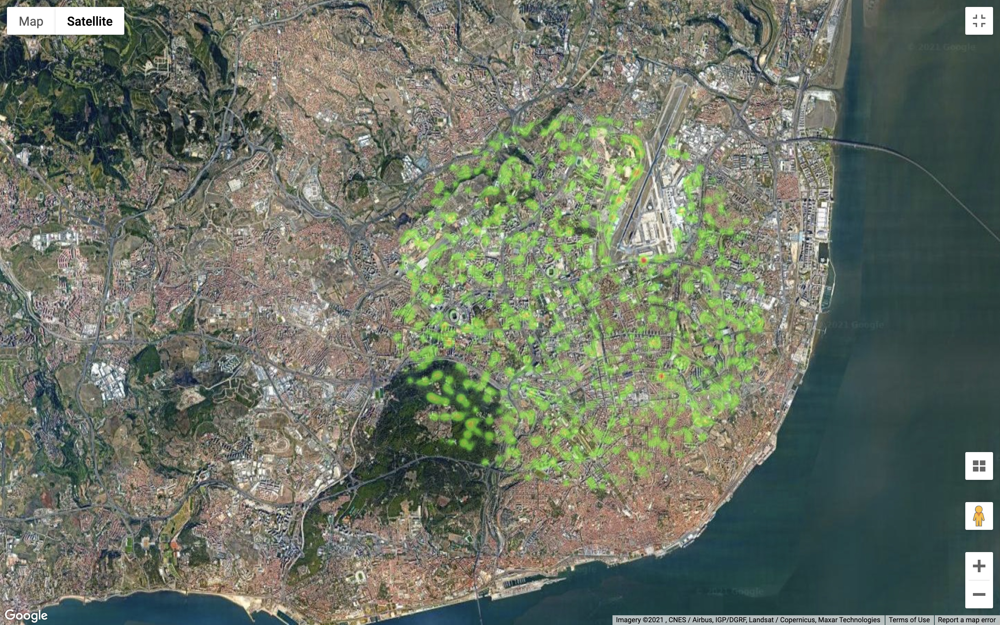

In [ ]:
from PIL import Image

Image.open("/content/Screenshot 2021-05-14 at 22.08.17.jpg")

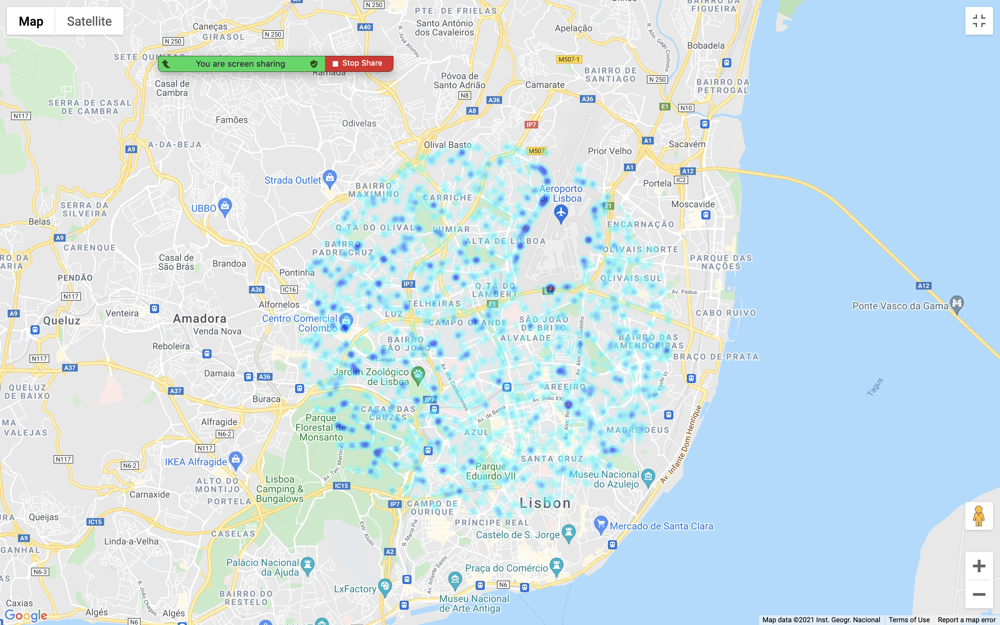

In [12]:
Image.open("/content/Screenshot 2021-05-14 at 22.25.37.jpg")

#### Folium

In [13]:
import pandas as pd
import folium
from folium import plugins

In [14]:
for point, weight in zip(locations, weights):
  plugins.HeatMap([point], radius=weight).add_to(m)

In [ ]:
m

In [ ]:
m.save(outfile='map.html')

## Conclusions

### Scalability and Impact

Our approach is very much scalable and easy to visualize the predictions by creating heatmaps. Our approach requires only a trained pothole detection model to provide predictions of number of potholes in a given image.

### Insights

Nowadays, mobility is a priority theme for the European Union in the context of urban development - the EU even announced that funding for sustainable infrastructure, including for new or better bike lanes, will be doubled to €20 billion. At the same time, hundreds of people, including cyclists and pedestrians, lose their lives on our roads. We hesitate in commuting by bicycle simply because it is perceived as dangerous!



The model we built below presents our view of the bicycle usage and bicycle infrastructure (roads and potholes) in the Porto and Lisbon areas.



**Here are 3 key areas that bicycling is helpful to the community:**

> Health benefits: It keeps people healthy.

Bicycling can help to protect people from serious diseases such as stroke, heart attack, some cancers, depression, diabetes, obesity and arthritis. Riding a bike is healthy, fun and a low-impact form of exercise for all ages. It is easy to fit into people’s daily routine by riding to the shops, park, school or work. Overall, it helps people stay healthy. This will aligned with the UN SGD goal #3(Good health and well-being).

> Economic benefits: It can increase revenue through tourism, impact on local business, eg. bike shops, etc.

Bicycling means better business and stronger local economy! The economic benefits of building a bicycle infrastructure cannot be overstated. These benefits include increased jobs, spending, tourism, and a decrease in accidents due to ramping up bicycle safety. Other benefits that a city can expect from investing in bicycling include: Reduced costs from not building expensive car parking lots, people who ride bikes save their company money on healthcare costs, and lower travel costs for bicycle riders means more money to spend on local businesses

> Environmental benefits: It can drastically reduce traffic congestion and reduce emissions

If everyone in the world who works less than 5 miles from home cycled instead of driving to work one day a week, it would reduce greenhouse-gas emissions by 5 million tons a year. That’s the equivalent of 1 million people getting rid of their cars. And it would save over 24 billion gallons of gas. 60% of the pollutants created from motorized transportation are produced during the first few minutes of the ride. Because this is when your car is working the most inefficiently, these “warm up” trips driving a shorter distance produce more air pollutants than driving on a longer trip. Riding a bike also reduces traffic congestion. Short trips are the ones that can easily be replaced by a bike ride. Idling cars are bad for the environment, so less cars on the road means a healthier community. Someone riding a bike can go 960 miles on the amount of energy that goes into moving a car 20 miles. Emissions don’t only affect the air. Airborne-pollutants fall to the ground with precipitation, which pollutes our groundwater and our farmland too. This will aligned with the UN SGD goal #7 (affordable and clean energy).

In summary, based on our analysis, we believe that an investment in infrastructure development viz. fixing potholes, adding dedicated bike lanes, etc. will benefit the region by increasing the city revenue inflow through lower medicare costs, increased tourism revenue and reduced congestion and pollution.


### Observation

Sample observation: 

- There are some key thoroughfares such as Av. Santos e Castro in Lisbon that need to be prioritized for pothole maintenance and repair. 
- Av. Santos e Castro has 29 potholes which pose a major hindrance for people commuting to/from the Lisbon airport. 
- As a matter of fact, this might be a contributor to economic loss resulting from passengers missing flights, vehicle damage, pollution and traffic congestion.

According to Wikipedia, there are 14M passengers traveling to/from the Lisbon Airport each year. Even if were to assume 25% of that volume commutes on Av Santos e Castro, a “pothole free Av Santos e Castro” would likely result in time savings of 4M travelers x 0.25 (4 travelers per vehicle) x 15 potholes on average x 5s time savings per pothole ~ 20,000 hours of cost savings and will give a lot of peace of mind to passengers and drivers alike. In addition, fixing the potholes will have a major positive impact on the environment, minimize vehicle damages and make it more attractive to tourists.

References for our write-up:  
 https://www.advocacyadvance.org/the-economic-benefits-of-bicycle-infrastructure
 https://www.health.harvard.edu/staying-healthy/the-top-5-benefits-of-cycling
 https://bikeleague.org/sites/default/files/Bicycling_and_the_Economy-Econ_Impact_Studies_web.pdf

### Future Work

This is a very exciting and very much data related problem that can be solved using state-of-the-art CV techniques. And the solution can be scaled globally.


The training data we noticed were quite different from the inference data. The training data from the 3 different sources have clearer views of the potholes and at angles directly overseeing the potholes. The inference data on the other hand, are google street map images. Training on data more similar to the streetmap would be more ideal. 
